# Figure 2: Proteases

In [1]:
import os
from pathlib import Path
import pickle

import scanpy as sc
import anndata
import scplot as scp
from scipy import sparse
import scipy as sp

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from statsmodels.stats.multitest import multipletests
import statsmodels as sm

from tqdm.auto import tqdm
from joblib import Parallel, delayed

In [2]:
# R integration
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter
from rpy2.robjects import pandas2ri, numpy2ri, r, Formula
from rpy2.robjects.vectors import StrVector, FloatVector, ListVector
import rpy2.robjects as ro
from rpy2.rinterface_lib.embedded import RRuntimeError

In [3]:
#%pip install git+https://github.com/has2k1/plotnine.git -U

In [4]:
from plotnine import *

In [5]:
sc.set_figure_params(dpi=150)

In [6]:
from matplotlib import cm
from matplotlib.colors import to_hex

pal = cm.get_cmap(plt.get_cmap('tab20'))
tab20 = [to_hex(x) for x in pal.colors]
tab20

['#1f77b4',
 '#aec7e8',
 '#ff7f0e',
 '#ffbb78',
 '#2ca02c',
 '#98df8a',
 '#d62728',
 '#ff9896',
 '#9467bd',
 '#c5b0d5',
 '#8c564b',
 '#c49c94',
 '#e377c2',
 '#f7b6d2',
 '#7f7f7f',
 '#c7c7c7',
 '#bcbd22',
 '#dbdb8d',
 '#17becf',
 '#9edae5']

In [7]:
type2color = {
    'Epithelial (AT1)': '#1f77b4',
    'Epithelial (AT2)': '#ff7f0e',
    'Epithelial (Transitional AT2)': '#ffbb78',
    'Epithelial (Basal)': '#2ca02c',
    'Epithelial (Suprabasal)': '#98df8a',
    'Epithelial (Ciliated)': '#d62728',
    'Epithelial (Club)': '#ff9896',
    'Epithelial (Secretory)': '#9467bd',
    'Epithelial (Goblet)': '#c5b0d5',
    'Epithelial (Tuft-like)': '#8c564b',
    'Epithelial (Mucous, ciliated)': '#f7b6d2',
    'Epithelial (Mucous)': '#e377c2',
    'Epithelial (Submucosal secretory)': '#c7c7c7',
    'Epithelial (Cycling)': '#bcbd22',
}

In [8]:
def get_expressed(ad, genes, keys, thres=0, use_raw=False):
    genedf = sc.get.obs_df(ad, keys=[*keys, *genes], use_raw=use_raw)
    grouped = genedf.groupby(keys, observed=True)
    
    exp = grouped.agg(lambda x: np.nanmean(x[x>thres])).fillna(0)
    percent = grouped.agg(lambda x: np.mean(x>thres)*100).fillna(0)

    percent = percent.reset_index().melt(id_vars=keys, value_name='Percent exp.', var_name='gene')
    exp = exp.reset_index().melt(id_vars=keys, value_name='Mean expression', var_name='gene')
    df = percent.merge(exp)

    return df

## Fit models

In [18]:
def fit_lme(formula, df, family='gaussian', random_effect=True, **fit_kwargs):
    f = Formula(formula)
    
    lme4 = importr('lme4')
    lmer = importr('lmerTest') # overloads lmer function from lme4 package
    base = importr('base')
    stats = importr('stats')

    with localconverter(ro.default_converter + pandas2ri.converter):
        if family == 'gaussian':
            if random_effect:
                control = lme4.lmerControl(**{'calc.derivs': True,
                                              'check.rankX': 'silent.drop.cols', 
                                              'check.conv.singular': r('lme4::.makeCC')(action = "ignore",  tol = 1e-4)})
                fit = lmer.lmer(f, df, control=control, **fit_kwargs)
            else:
                fit = stats.lm(f, df, **fit_kwargs)
        elif family in ('binomial', 'poisson'):
            if random_effect:
                #control = lme4.glmerControl(**{'optimizer': 'nloptwrap', 
                #                               'calc.derivs': True,
                #                               'check.rankX': 'silent.drop.cols',
                #                               'check.conv.singular': r('lme4::.makeCC')(action = "ignore",  tol = 1e-4)})

                control = lme4.glmerControl(**{'check.rankX': 'silent.drop.cols',
                                               'check.conv.singular': r('lme4::.makeCC')(action = "ignore",  tol = 1e-4)})

                fit = lme4.glmer(f, df, control=control, family=family, **fit_kwargs)

            else:
                fit = stats.glm(f, df, family=family, **fit_kwargs)
        else:
            if random_effect:
                control = lme4.glmerControl(**{'optimizer': 'nloptwrap', 
                                   'calc.derivs': True,
                                   'check.rankX': 'silent.drop.cols',
                                   'check.conv.singular': r('lme4::.makeCC')(action = "ignore",  tol = 1e-4)})
                fit = r('lme4::glmer.nb')(f, df, **{'nb.control': control}, **fit_kwargs)
            else:
                fit = r('MASS::glm.nb')(f, df, **fit_kwargs)
        
        anova_df = stats.anova(fit)
    
    coef_df = r['as.data.frame'](stats.coef(base.summary(fit)))
    coef_df = pandas2ri.rpy2py(coef_df)

    return coef_df, anova_df

def _fit(formula, gene, adata, obs_features, use_raw, family, random_effect):
    gene_vec = adata[:, gene].X if not use_raw else adata.raw[:, gene].X
    covariates = adata.obs[obs_features].copy()
    covariates.loc[:, 'gene'] = gene_vec.A.squeeze()

    try:
        coefs, anova = fit_lme(formula, covariates, family=family, random_effect=random_effect)
    except RRuntimeError:
        coefs, anova = None, None

    return coefs, anova


def fit_lme_adata(adata, genes, formula, obs_features, random_effect, family='gaussian', use_raw=False, n_jobs=6):

    adata = adata.copy()
    for f in obs_features:
        if adata.obs[f].dtype.name == 'category' and len(adata.obs[f].cat.categories) < 2:
            print(f'\tRemoving {f}... ({adata.obs[f].cat.categories.to_list()})')
            adata.obs[f] = adata.obs[f].cat.codes
            if f == random_effect:
                random_effect = False

    if n_jobs == 1:
        para_result = [_fit(formula, x, adata, obs_features, use_raw, family,random_effect) for x in (genes)]
    else:    
        para_result = Parallel(n_jobs=n_jobs)(delayed(_fit)(formula, 
                                                            x, 
                                                            adata,
                                                            obs_features, 
                                                            use_raw, 
                                                            family,
                                                            random_effect) for x in (genes))
    
    coef_df = {k:v[0] for k, v in zip(genes, para_result) if v[0] is not None}
    anova_df = {k:v[1] for k, v in zip(genes, para_result) if v[1] is not None}   

    coef_df = pd.concat([df.assign(gene=gene) for gene, df in coef_df.items()], axis=0)
    coef_df = coef_df.reset_index().rename(columns={'index': 'fixed_effect'})

    anova_df = pd.concat([df.assign(gene=gene) for gene, df in anova_df.items()], axis=0)
    anova_df = anova_df.reset_index().rename(columns={'index': 'fixed_effect'})
   
    return coef_df, anova_df


In [22]:
def fit_coexpression_model(adata, label, ref_gene, use_genes, groupby, random_effect, subsample_ref=True):

    use_genes = list(set(use_genes) - set([ref_gene]))
    adata = adata[:, [ref_gene] + use_genes].copy()
    adata.X = (adata.X>0).astype(int) # binarize for binomial GLMM

    adata.obs[f'bin{ref_gene}'] = adata.obs_vector(ref_gene)
    res = []
    
    ct = (adata.obs.groupby(groupby).size() >= 5) & (adata.obs.groupby(groupby)[f'bin{ref_gene}'].sum() >= 5)
    ct = ct[ct].index.to_list()
    
    if not ct:
        print(f'!!! Dataset {label} No available cell types...')
        return

    for celltype in tqdm(ct):
        ad = adata[(adata.obs[groupby] == celltype)].copy()

        if subsample_ref:
            ad_pos = ad[ad.obs[f'bin{ref_gene}'] == 1]
            ad_neg = sc.pp.subsample(ad[ad.obs[f'bin{ref_gene}'] == 0], n_obs=len(ad_pos), copy=True)
            ad = ad_pos.concatenate(ad_neg)
        
        genes = ad.var_names.difference([ref_gene]).to_list()
        genes = (len(ad) > sc.get.obs_df(ad, genes).sum(0)) & (sc.get.obs_df(ad, genes).sum(0) >= 5)
        genes = genes[genes].index.to_list()
        
        if len(genes) == 0:
            continue
            
        print(f'*** Dataset: {label:>60} Group: {celltype:>40} # genes: {len(genes):>5} # cells: {len(ad):>6} ***')
        ad.obs[random_effect] = ad.obs[random_effect].astype('category')
        coef, anova = fit_lme_adata(ad, 
                                    genes, 
                                    f'gene ~ 1 + bin{ref_gene} + (1|{random_effect})',
                                    [f'bin{ref_gene}', random_effect],
                                    family='binomial',
                                    random_effect = random_effect,
                                    n_jobs=min(20, len(genes)))
        
        sig, pval, _, _ = multipletests(coef['Pr(>|z|)'], method='fdr_bh', alpha=0.1)
        coef['significant'] = sig
        coef['pval_adj'] = pval
        coef['neglog_pval_adj'] = -np.log10(coef.pval_adj+1e-300)
        res.append(coef.assign(celltype=celltype))

    if not res:
        return None

    res = pd.concat(res, axis=0)
    res = res[res.fixed_effect == f'bin{ref_gene}'].sort_values('pval_adj').reset_index(drop=True).assign(dataset=label)
    
    return res

In [9]:
genes_volcano = [
    'FURIN',
    'PCSK1',
    'PCSK2',
    'PCSK4',
    'PCSK5',
    'PCSK6',
    'PCSK7',
    'TMPRSS2',
]

In [10]:
genes = [
    'FURIN',
    'PCSK1',
    'PCSK2',
    'PCSK4',
    'PCSK5',
    'PCSK6',
    'PCSK7',
    'TMPRSS2',
    'CTSL',
]

## List of proteases

In [11]:
proteases = list(sorted(set(pd.read_excel('../corona-protease/Human proteases.xlsx', header=None)[0].values)))

## Read the Regev/Rajagopal dataset

In [12]:
adata_raj = sc.read('../tsankov-mitofilter-processed-compressed.h5ad')
adata_raj

/home/gokcen/.miniconda3/lib/python3.8/site-packages/anndata/compat/__init__.py:150: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
/home/gokcen/.miniconda3/lib/python3.8/site-packages/anndata/compat/__init__.py:150: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.


AnnData object with n_obs × n_vars = 359483 × 34140
    obs: 'B_cells', 'ClusterID', 'ClusterName', 'G2M_Score', 'Ionocytes', 'Neuroendocrine', 'Phase', 'S_Score', 'SeuratClustering', 'T_NK_cells', 'Tuft_like', 'avg_hkgene', 'batch', 'celltype', 'celltypeN', 'nCount_RNA', 'nFeature_RNA', 'nGene', 'nUMI', 'n_hkgene', 'old_ident', 'orig_ident', 'orig_identSec', 'percent_mito', 'res_0_2', 'res_0_4', 'res_0_6', 'res_0_9', 'res_10', 'res_1_2', 'res_1_5', 'res_1_8', 'res_2_5', 'res_5', 'typeID', 'ind_id', 'basename', 'gender', 'age', 'region', 'CellType', 'Region-CellType', 'ACE2/TMPRSS2', 'Cell Type', 'pd_distalproximal', 'percent_mito_thresh', 'mito_filter', 'confirmed_smoker', 'n_counts'
    var: 'Selected-10x_HU48_180901', 'Selected-10x_HU32_180121', 'Selected-10x_HU28_180121', 'Selected-10x_HU39_180325', 'Selected-10x_HU62_190901', 'Selected-10x_HU30_180121', 'Selected-10x_HU40_180901', 'Selected-10x_HU49_180901', 'Selected-10x_HU37_180325', 'Selected-10x_HU52_190405', 'highly_variable'

In [ ]:
df = adata_raj.obs[['region', 'orig_identSec', 'confirmed_smoker', 'age', 'gender', 'ind_id']].drop_duplicates().reset_index()
df

In [14]:
adata_raj.obs['Cell Type'] = pd.Categorical(adata_raj.obs['Cell Type'])
del adata_raj.uns['Cell Type_colors']

In [15]:
adata_raj.obs.columns

Index(['B_cells', 'ClusterID', 'ClusterName', 'G2M_Score', 'Ionocytes',
       'Neuroendocrine', 'Phase', 'S_Score', 'SeuratClustering', 'T_NK_cells',
       'Tuft_like', 'avg_hkgene', 'batch', 'celltype', 'celltypeN',
       'nCount_RNA', 'nFeature_RNA', 'nGene', 'nUMI', 'n_hkgene', 'old_ident',
       'orig_ident', 'orig_identSec', 'percent_mito', 'res_0_2', 'res_0_4',
       'res_0_6', 'res_0_9', 'res_10', 'res_1_2', 'res_1_5', 'res_1_8',
       'res_2_5', 'res_5', 'typeID', 'ind_id', 'basename', 'gender', 'age',
       'region', 'CellType', 'Region-CellType', 'ACE2/TMPRSS2', 'Cell Type',
       'pd_distalproximal', 'percent_mito_thresh', 'mito_filter',
       'confirmed_smoker', 'n_counts'],
      dtype='object')

In [16]:
sorted(adata_raj.obs['Cell Type'].unique())

['AT1',
 'AT2',
 'B.cells',
 'Basal',
 'Ciliated',
 'Endothelial',
 'Fibroblast',
 'Ionocytes',
 'Mast',
 'Mesothelium',
 'Myeloid',
 'Neuroendocrine',
 'Pericytes',
 'Secretory',
 'SmoothMuscle',
 'T.NK.cells',
 'Tuft.like']

In [17]:
c2c = {
    'AT1': 'Epithelial (AT1)',
    'AT2': 'Epithelial (AT2)',
    'Basal': 'Epithelial (Basal)',
    'Secretory': 'Epithelial (Secretory)',
    'Ciliated': 'Epithelial (Ciliated)',
    'Tuft.like': 'Epithelial (Tuft-like)',
    'Ionocytes': 'Epithelial (Ionocyte)',
    'Neuroendocrine': 'Epithelial (Neuroendocrine)',

    'Myeloid': 'Immune (Myeloid)',
    'B.cells': 'Immune (B cell)',    
    'T.NK.cells': 'Immune (T/NK cell)',
    'Mast': 'Immune (Mast)',
    
    'Endothelial': 'Stromal (Endothelial)',
    'Fibroblast': 'Stromal (Fibroblast)',
    'Pericytes': 'Stromal (Pericyte)',

    'Mesothelium': 'Mesothelium',
    'SmoothMuscle': 'SMC',
}

In [18]:
adata_raj.obs['Cell Type'] = pd.Categorical([c2c[x] for x in adata_raj.obs['Cell Type']], categories=c2c.values())

In [19]:
adata_raj.obs['ACE2+'] = adata_raj.obs_vector('ACE2')>0
pd.crosstab(adata_raj.obs['ACE2+'], adata_raj.obs['Cell Type'])

Cell Type,Epithelial (AT1),Epithelial (AT2),Epithelial (Basal),Epithelial (Secretory),Epithelial (Ciliated),Epithelial (Tuft-like),Epithelial (Ionocyte),Epithelial (Neuroendocrine),Immune (Myeloid),Immune (B cell),Immune (T/NK cell),Immune (Mast),Stromal (Endothelial),Stromal (Fibroblast),Stromal (Pericyte),Mesothelium,SMC
ACE2+,,,,,,,,,,,,,,,,,
False,18737,59536,90727,28899,11700,1030,815,389,25722,4397,41482,5493,14453,33649,4246,2182,12350
True,80,985,1238,960,301,5,3,1,3,1,11,0,7,41,29,2,9


In [21]:
interesting_genes = sorted(list(set(np.array(proteases)[np.isin(proteases, adata_raj.var_names.unique())].tolist())))

In [25]:
results = fit_coexpression_model(adata_raj, 'internal_lung', 'ACE2', interesting_genes, 'Cell Type', 'batch')

*** Dataset:                                                internal_lung Group:                         Epithelial (AT1) # genes:   312 # cells:    160 ***
*** Dataset:                                                internal_lung Group:                         Epithelial (AT2) # genes:   416 # cells:   1970 ***
*** Dataset:                                                internal_lung Group:                       Epithelial (Basal) # genes:   425 # cells:   2476 ***
*** Dataset:                                                internal_lung Group:                   Epithelial (Secretory) # genes:   432 # cells:   1920 ***
*** Dataset:                                                internal_lung Group:                    Epithelial (Ciliated) # genes:   394 # cells:    602 ***
*** Dataset:                                                internal_lung Group:                   Epithelial (Tuft-like) # genes:    73 # cells:     10 ***
*** Dataset:                                              

In [26]:
results.to_csv('tables/figure-5-supplementary-table-regevrajagopal-binomial_glmm-celltypes.csv', index=False)
results['celltype'] = pd.Categorical(results.celltype, categories=c2c.values())
results.head()

,fixed_effect,Estimate,Std. Error,z value,Pr(>|z|),gene,significant,pval_adj,neglog_pval_adj,celltype,dataset
0,binACE2,0.915208,0.093312,9.808033,1.039756e-22,C1R,True,2.522090e-22,21.598239,Epithelial (AT2),internal_lung
1,binACE2,0.806341,0.082985,9.716742,2.558360e-22,ST14,True,5.783526e-22,21.237807,Epithelial (Basal),internal_lung
2,binACE2,0.902463,0.094941,9.505566,1.989625e-21,CTSC,True,4.485892e-21,20.348151,Epithelial (Basal),internal_lung
3,binACE2,0.845371,0.092915,9.098280,9.177401e-20,TFRC,True,2.169204e-19,18.663700,Epithelial (AT2),internal_lung
4,binACE2,0.920890,0.101579,9.065797,1.236968e-19,HP,True,2.915459e-19,18.535293,Epithelial (AT2),internal_lung


In [22]:
results = pd.read_csv('tables/figure-5-supplementary-table-regevrajagopal-binomial_glmm-celltypes.csv')
results['celltype'] = pd.Categorical(results.celltype, categories=c2c.values())

In [23]:
df = results.copy()

df = df[df.celltype.str.startswith('Epithelial')]
df['celltype'].cat.remove_unused_categories(inplace=True)
df['furin'] = df.gene.isin(genes_volcano)
df['gene_celltype'] = [f'{x} ({y})' for x,y in zip(df.gene, df.celltype)]
df.head()

,fixed_effect,Estimate,Std. Error,z value,Pr(>|z|),gene,significant,pval_adj,neglog_pval_adj,celltype,dataset,furin,gene_celltype
0,binACE2,0.915208,0.093312,9.808033,1.039756e-22,C1R,True,2.522090e-22,21.598239,Epithelial (AT2),internal_lung,False,C1R (Epithelial (AT2))
1,binACE2,0.806341,0.082985,9.716742,2.558360e-22,ST14,True,5.783526e-22,21.237807,Epithelial (Basal),internal_lung,True,ST14 (Epithelial (Basal))
2,binACE2,0.902463,0.094941,9.505566,1.989625e-21,CTSC,True,4.485892e-21,20.348151,Epithelial (Basal),internal_lung,False,CTSC (Epithelial (Basal))
3,binACE2,0.845371,0.092915,9.098280,9.177401e-20,TFRC,True,2.169204e-19,18.663700,Epithelial (AT2),internal_lung,False,TFRC (Epithelial (AT2))
4,binACE2,0.920890,0.101579,9.065797,1.236968e-19,HP,True,2.915459e-19,18.535293,Epithelial (AT2),internal_lung,False,HP (Epithelial (AT2))


df['logDP'] = np.log10(df.DP)
df['total'] = df.DP + df.DN + df.PN + df.NP
df['ratioDP'] = df.DP/df.total
df['logratioDP'] = np.log2(df.ratioDP)

/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 7 x 7 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5a-coexpression-volcano-tsankov.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/layer.py:464: PlotnineWarning: geom_point : Removed 26 rows containing missing values.
  self.data = self.geom.handle_na(self.data)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/layer.py:464: PlotnineWarning: geom_point : Removed 26 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


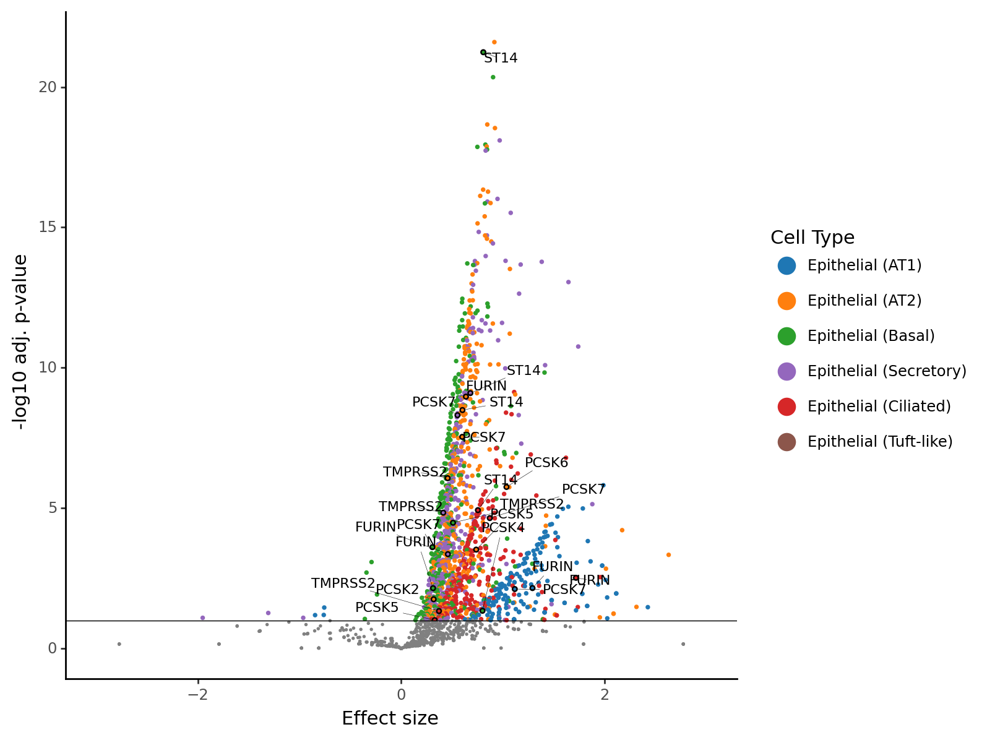

<ggplot: (8780216007446)>

In [26]:
df_text_idx = (df.furin) & (df.significant) #& (df.neglog_pval_adj>1.1) & (df.logodds>0.3)
g = (
    ggplot(aes(x='Estimate', y='neglog_pval_adj'), data=df[df.significant]) + 
    geom_point(aes(color='celltype'), size=0.5, data=df[(~df.furin) & (df.significant)]) +
    geom_point(aes(fill='celltype'), color='black', size=1., data=df[df_text_idx]) +
    geom_point(size=0.1, data=df[~df.significant], color='gray') +
    geom_text(aes(label='gene'), 
              size=8,
              color='black', 
              fontweight='normal',
              data=df[df_text_idx],
              adjust_text={'arrowprops': {'arrowstyle': '-', 'lw':0.2}, 'x':df.Estimate.values, 'y':df.neglog_pval_adj.values, 'expand_points': (0.7,1.8)}
             ) + 
    geom_hline(yintercept=1, size=0.3) +
    theme_classic() + 
    theme(figure_size=(7,7)) +
    labs(x='Effect size', y='-log10 adj. p-value', color='Cell Type') +
    scale_color_manual(values=type2color) +
    scale_fill_manual(values=type2color) + xlim(-3,3) + 
    guides(color = guide_legend(override_aes = dict(size=5)), fill=None)
)

ggsave(g, 'figures/figure-5a-coexpression-volcano-tsankov.pdf', width=7, height=7, useDingbats=False)

g

/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 7 x 7 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5a-coexpression-volcano-tsankov-nolabels.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/layer.py:464: PlotnineWarning: geom_point : Removed 26 rows containing missing values.
  self.data = self.geom.handle_na(self.data)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/layer.py:464: PlotnineWarning: geom_point : Removed 26 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


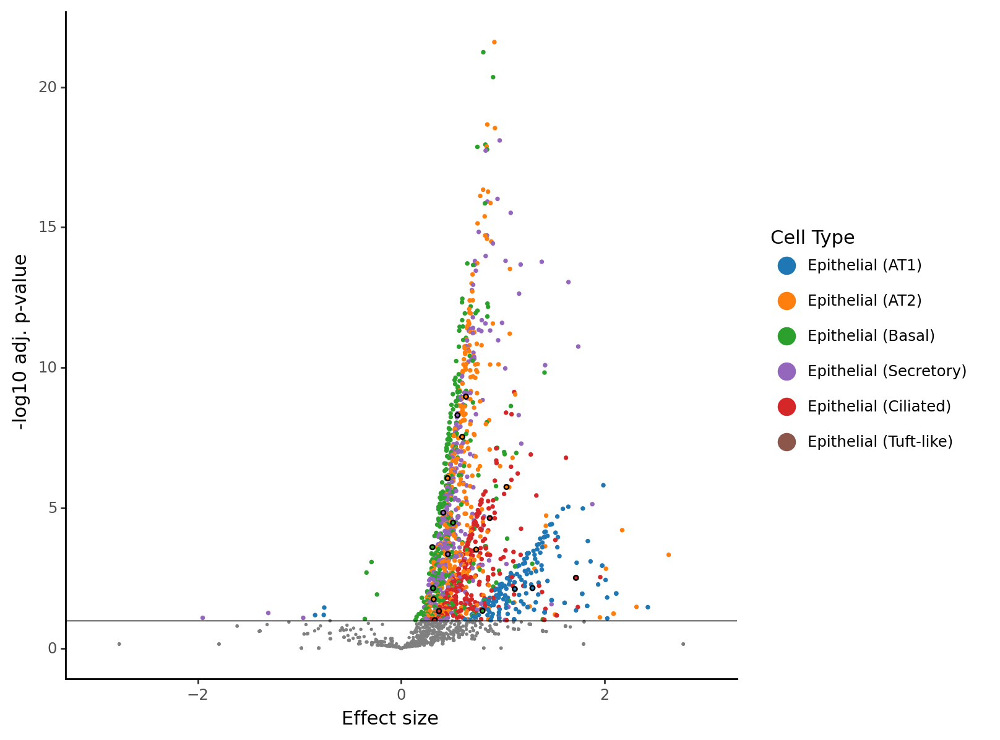

<ggplot: (8731922255722)>

In [31]:
df_text_idx = (df.furin) & (df.significant) #& (df.neglog_pval_adj>1.1) & (df.logodds>0.3)
g = (
    ggplot(aes(x='Estimate', y='neglog_pval_adj'), data=df[df.significant]) + 
    geom_point(aes(color='celltype'), size=0.5, data=df[(~df.furin) & (df.significant)]) +
    geom_point(aes(fill='celltype'), color='black', size=1., data=df[df_text_idx]) +
    geom_point(size=0.1, data=df[~df.significant], color='gray') +
    #geom_text(aes(label='gene_celltype'), 
    #          size=8,
    #          color='black', 
    #          fontweight='normal',
    #          data=df[df_text_idx],
    #          adjust_text={'arrowprops': {'arrowstyle': '-', 'lw':0.2}, 'x':df.coef_mle.values, 'y':df.neglog_pval_adj.values, 'expand_points': (0.5,1.8)}
    #         ) + 
    geom_hline(yintercept=1, size=0.3) +
    theme_classic() + 
    theme(figure_size=(7,7)) +
    labs(x='Effect size', y='-log10 adj. p-value', color='Cell Type') +
    scale_color_manual(values=type2color) +
    scale_fill_manual(values=type2color) + xlim(-3,3) + 
    guides(color = guide_legend(override_aes = dict(size=5)), fill=None)
)

ggsave(g, 'figures/figure-5a-coexpression-volcano-tsankov-nolabels.pdf', width=7, height=7, useDingbats=False)

g

In [32]:
df.sort_values(['pval_adj', 'Estimate'], ascending=[True, False]).head()

,fixed_effect,Estimate,Std. Error,z value,Pr(>|z|),gene,significant,pval_adj,neglog_pval_adj,celltype,dataset,furin,gene_celltype
0,binACE2,0.915208,0.093312,9.808033,1.039756e-22,C1R,True,2.522090e-22,21.598239,Epithelial (AT2),internal_lung,False,C1R (Epithelial (AT2))
1,binACE2,0.806341,0.082985,9.716742,2.558360e-22,ST14,True,5.783526e-22,21.237807,Epithelial (Basal),internal_lung,False,ST14 (Epithelial (Basal))
2,binACE2,0.902463,0.094941,9.505566,1.989625e-21,CTSC,True,4.485892e-21,20.348151,Epithelial (Basal),internal_lung,False,CTSC (Epithelial (Basal))
3,binACE2,0.845371,0.092915,9.098280,9.177401e-20,TFRC,True,2.169204e-19,18.663700,Epithelial (AT2),internal_lung,False,TFRC (Epithelial (AT2))
4,binACE2,0.920890,0.101579,9.065797,1.236968e-19,HP,True,2.915459e-19,18.535293,Epithelial (AT2),internal_lung,False,HP (Epithelial (AT2))


/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 7 x 7 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5-supplement-coexpression-volcano-tsankov-top20.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/layer.py:464: PlotnineWarning: geom_point : Removed 26 rows containing missing values.
  self.data = self.geom.handle_na(self.data)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/layer.py:464: PlotnineWarning: geom_point : Removed 26 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


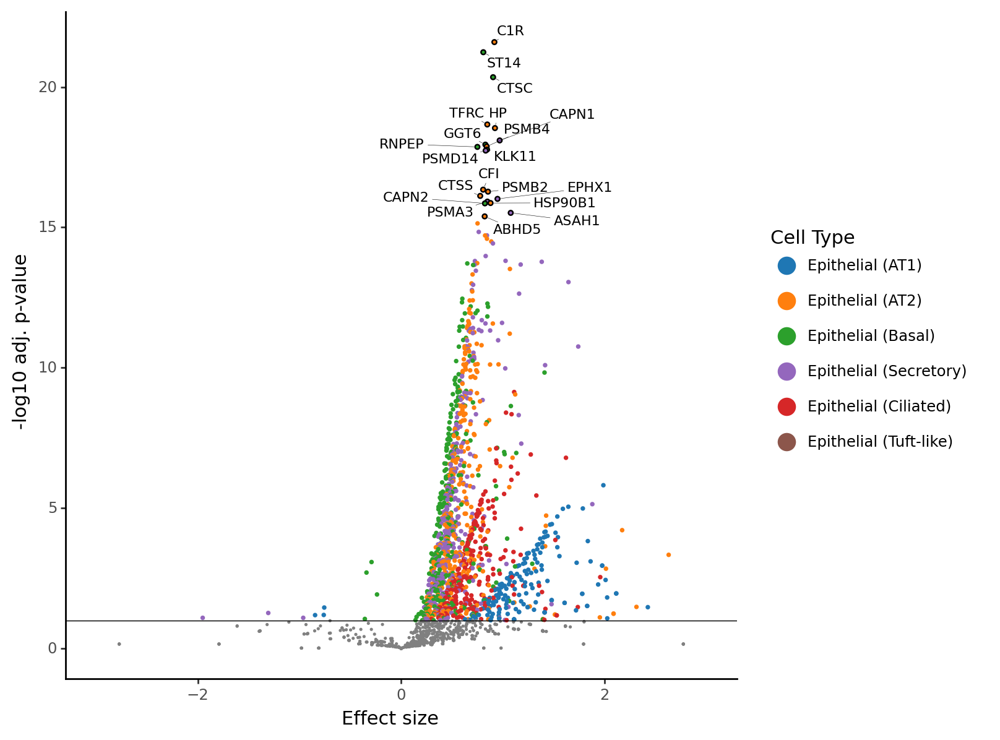

<ggplot: (-9223363304931206526)>

In [35]:
#df_text_idx = (df.neglog_pval_adj>30)  & (df.significant)

df_text_idx = df.sort_values(['pval_adj', 'Estimate'], ascending=[True, False])[:20].index
g = (
    ggplot(aes(x='Estimate', y='neglog_pval_adj'), data=df[df.significant]) + 
    geom_point(aes(color='celltype'), size=0.5, data=df[(~df.furin) & (df.significant)]) +
    geom_point(aes(fill='celltype'), color='black', size=1., data=df.loc[df_text_idx]) +
    geom_point(size=0.05,
               data=df[~df.significant], color='gray') +
    geom_text(aes(label='gene'), 
              size=8,
              color='black', 
              fontweight='normal',
              data=df.loc[df_text_idx],
              adjust_text={'arrowprops': {'arrowstyle': '-', 'lw':0.2}, 'x':df.Estimate.values, 'y':df.neglog_pval_adj.values, 'expand_points': (1.2,1.8)}
             ) + 
    geom_hline(yintercept=1, size=0.3) +
    theme_classic() + 
    theme(figure_size=(7,7)) +
    labs(x='Effect size', y='-log10 adj. p-value', color='Cell Type') +
    scale_color_manual(values=type2color) +
    scale_fill_manual(values=type2color) + xlim(-3,3) + 
    guides(color = guide_legend(override_aes = dict(size=5)), fill=None)
)

ggsave(g, 'figures/figure-5-supplement-coexpression-volcano-tsankov-top20.pdf', width=7, height=7, useDingbats=False)

g

## Dotplot

In [24]:
res = results.copy()
res = res.rename(columns={'Cell Type': 'celltype'}).copy()
res = res[res.gene.isin(genes)].sort_values('pval_adj').reset_index(drop=True)

res.head()

,fixed_effect,Estimate,Std. Error,z value,Pr(>|z|),gene,significant,pval_adj,neglog_pval_adj,celltype,dataset
0,binACE2,0.635371,0.102605,6.192425,5.924573e-10,FURIN,True,1.073910e-09,8.969032,Epithelial (AT2),internal_lung
1,binACE2,0.552498,0.092805,5.953330,2.627411e-09,PCSK7,True,4.902987e-09,8.309539,Epithelial (Secretory),internal_lung
2,binACE2,0.599174,0.106248,5.639406,1.706373e-08,PCSK7,True,2.903277e-08,7.537112,Epithelial (AT2),internal_lung
3,binACE2,0.455912,0.091036,5.008037,5.498797e-07,TMPRSS2,True,8.632074e-07,6.063885,Epithelial (AT2),internal_lung
4,binACE2,1.034135,0.212556,4.865233,1.143220e-06,PCSK6,True,1.767954e-06,5.752529,Epithelial (AT2),internal_lung


In [25]:
sorted(res.celltype.unique())

['Epithelial (AT1)',
 'Epithelial (AT2)',
 'Epithelial (Basal)',
 'Epithelial (Ciliated)',
 'Epithelial (Secretory)',
 'Epithelial (Tuft-like)',
 'SMC',
 'Stromal (Endothelial)',
 'Stromal (Fibroblast)',
 'Stromal (Pericyte)']

In [26]:
celltypes_ordered = [
    'Epithelial (AT1)',
    'Epithelial (AT2)',
    'Epithelial (Basal)',
    'Epithelial (Secretory)',
    'Epithelial (Ciliated)',
    'Epithelial (Tuft-like)',
    'Epithelial (Ionocyte)',
    'Epithelial (Neuroendocrine)',

    'Immune (Myeloid)',
    'Immune (B cell)',
    'Immune (T/NK cell)',
    'Immune (Mast)',

    'Stromal (Endothelial)',
    'Stromal (Fibroblast)',
    'Stromal (Pericyte)',
    'Mesothelium',
    'SMC',
]

In [39]:
genes

['FURIN',
 'PCSK1',
 'PCSK2',
 'PCSK4',
 'PCSK5',
 'PCSK6',
 'PCSK7',
 'TMPRSS2',
 'CTSL']

In [40]:
df = res[res.gene.isin(genes)].copy()
df['celltype'] = pd.Categorical(df.celltype, categories=reversed(celltypes_ordered))
df['gene'] = pd.Categorical(df.gene, categories=(genes))

#df['Estimate'] = df.logodds

#df['logDP'] = np.log2(df.DP)
#df['total'] = df.DP + df.DN + df.PN + df.NP
#df['ratioDP'] = df.DP/df.total
#df['DP_percent'] = df.DP/df.total*100
#df['logratioDP'] = np.log2(df.ratioDP)

#df.loc[~((df.logodds>0) & (df.odds>0) & (np.isfinite(df.odds))), 'DP_percent'] = np.nan

In [41]:
sorted(df.celltype.unique())

['Epithelial (AT1)',
 'Epithelial (AT2)',
 'Epithelial (Basal)',
 'Epithelial (Ciliated)',
 'Epithelial (Secretory)',
 'Epithelial (Tuft-like)',
 'SMC',
 'Stromal (Endothelial)',
 'Stromal (Fibroblast)',
 'Stromal (Pericyte)']

In [42]:
df.head()

,fixed_effect,Estimate,Std. Error,z value,Pr(>|z|),gene,significant,pval_adj,neglog_pval_adj,celltype,dataset
0,binACE2,0.635371,0.102605,6.192425,5.924573e-10,FURIN,True,1.073910e-09,8.969032,Epithelial (AT2),internal_lung
1,binACE2,0.552498,0.092805,5.953330,2.627411e-09,PCSK7,True,4.902987e-09,8.309539,Epithelial (Secretory),internal_lung
2,binACE2,0.599174,0.106248,5.639406,1.706373e-08,PCSK7,True,2.903277e-08,7.537112,Epithelial (AT2),internal_lung
3,binACE2,0.455912,0.091036,5.008037,5.498797e-07,TMPRSS2,True,8.632074e-07,6.063885,Epithelial (AT2),internal_lung
4,binACE2,1.034135,0.212556,4.865233,1.143220e-06,PCSK6,True,1.767954e-06,5.752529,Epithelial (AT2),internal_lung


In [43]:
df.Estimate.max()

2.772588722239781

/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 3.5 x 7 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5b-coexpression-dotplot.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)


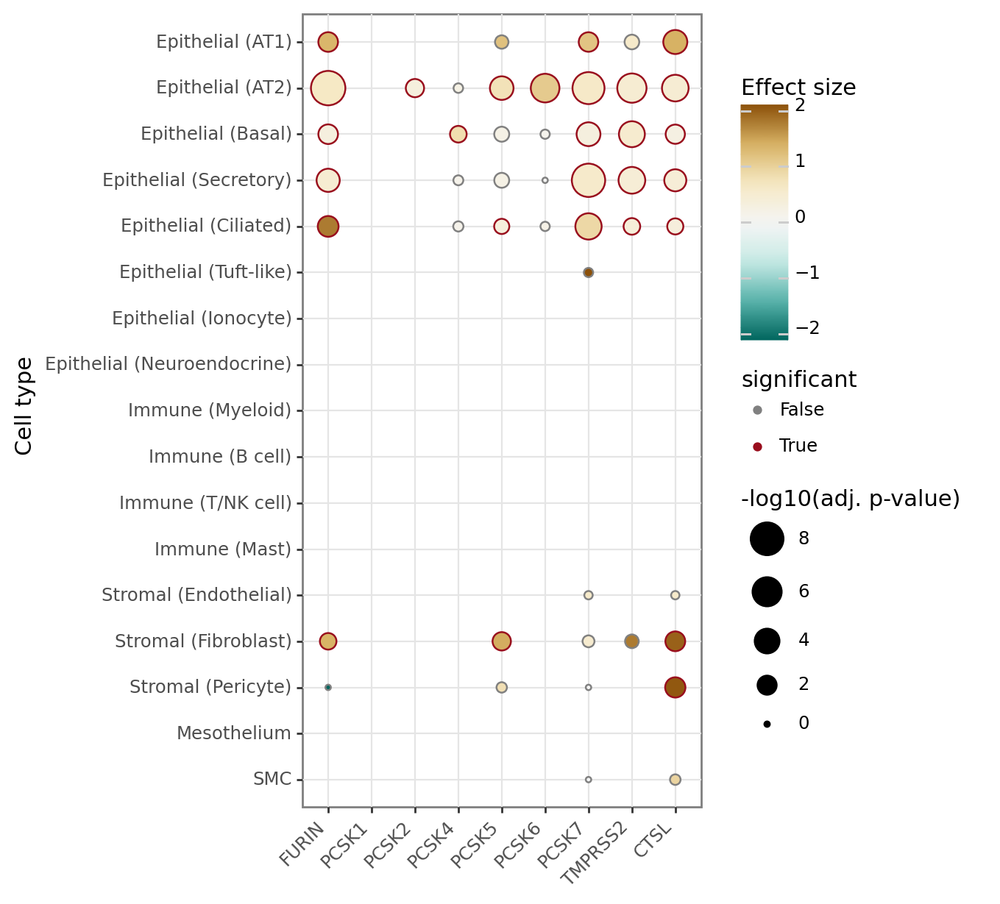

<ggplot: (8731921935887)>


In [44]:
df.loc[df.Estimate < -2, 'Estimate'] = -2
df.loc[df.Estimate > 2, 'Estimate'] = 2
#df.loc[df.neglog_pval_adj > 10, 'neglog_pval_adj'] = 10

#df['celltype'] = pd.Categorical(df.celltype, categories = reversed(sorted(df.celltype.unique())))
#df['dataset'] = pd.Categorical(df.dataset, categories = reversed(sorted(df.dataset.unique())))
limit = max(df.Estimate.abs()) * np.array([-1, 1])


g = (
    ggplot(aes(x='gene', y='celltype'), data=df) +
    geom_point(aes(size='neglog_pval_adj', fill='Estimate', color='significant'))+
    scale_fill_distiller(type='div', limits=limit, name='Effect size') + 
    scale_color_manual(values=('#808080', '#990E1D')) + 
    labs(size = "-log10(adj. p-value)", y='Cell type', x='') +
    guides(size = guide_legend(reverse=True)) +
    theme_bw() +
    scale_size(range = (1,9))+
    scale_y_discrete(drop=False) + 
    scale_x_discrete(drop=False) + 
    theme(
      figure_size=(3.5,7),
      legend_key=element_blank(),
      axis_text_x = element_text(rotation=45, hjust=1.),
    )
)

ggsave(g, 'figures/figure-5b-coexpression-dotplot.pdf', width=3.5, height=7)
print(g)

## Dotplot for Top 20 genes in AT2s

In [45]:
top20_genes = results[results['celltype'] == 'Epithelial (AT2)'].sort_values('pval_adj')[:20].gene.values.tolist()
top20_genes

['C1R',
 'TFRC',
 'HP',
 'PSMB4',
 'CFI',
 'PSMB2',
 'CTSS',
 'HSP90B1',
 'ABHD5',
 'GFPT1',
 'LGMN',
 'LTA4H',
 'PSMB5',
 'HM13',
 'EIF3F',
 'PSMD7',
 'CAPN8',
 'DERL1',
 'CPD',
 'CAPN1']

In [46]:
len(set(top20_genes))

20

In [47]:
df = results.copy()
df = df[df.gene.isin(top20_genes)].sort_values('pval_adj').reset_index(drop=True)
df = df[df.gene.isin(top20_genes)].copy()
df['celltype'] = pd.Categorical(df.celltype, categories=reversed(celltypes_ordered))
df['gene'] = pd.Categorical(df.gene, categories=(top20_genes))
df.head()

,fixed_effect,Estimate,Std. Error,z value,Pr(>|z|),gene,significant,pval_adj,neglog_pval_adj,celltype,dataset
0,binACE2,0.915208,0.093312,9.808033,1.039756e-22,C1R,True,2.522090e-22,21.598239,Epithelial (AT2),internal_lung
1,binACE2,0.845371,0.092915,9.098280,9.177401e-20,TFRC,True,2.169204e-19,18.663700,Epithelial (AT2),internal_lung
2,binACE2,0.920890,0.101579,9.065797,1.236968e-19,HP,True,2.915459e-19,18.535293,Epithelial (AT2),internal_lung
3,binACE2,0.967194,0.107988,8.956538,3.350306e-19,CAPN1,True,8.018462e-19,18.095909,Epithelial (Secretory),internal_lung
4,binACE2,0.839564,0.094341,8.899271,5.621462e-19,PSMB4,True,1.317481e-18,17.880256,Epithelial (AT2),internal_lung


/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 7 x 6 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5f-coexpression-dotplot-AT2-top20.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)


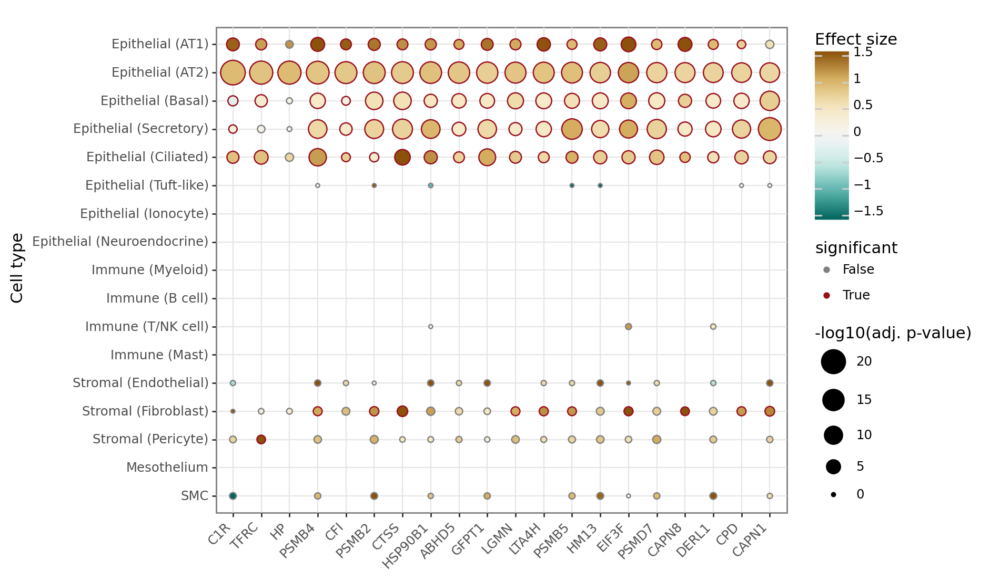

<ggplot: (-9223363305130265975)>


In [48]:
df.loc[df.Estimate < -1.5, 'Estimate'] = -1.5
df.loc[df.Estimate > 1.5, 'Estimate'] = 1.5
#df.loc[df.neglog_pval_adj > 10, 'neglog_pval_adj'] = 10

#df['celltype'] = pd.Categorical(df.celltype, categories = reversed(sorted(df.celltype.unique())))
#df['dataset'] = pd.Categorical(df.dataset, categories = reversed(sorted(df.dataset.unique())))
limit = max(df.Estimate.abs()) * np.array([-1, 1])


g = (
    ggplot(aes(x='gene', y='celltype'), data=df) +
    geom_point(aes(size='neglog_pval_adj', fill='Estimate', color='significant'))+
    scale_fill_distiller(type='div', limits=limit, name='Effect size') + 
    scale_color_manual(values=('#808080', '#990E1D')) + 
    labs(size = "-log10(adj. p-value)", y='Cell type', x='') +
    guides(size = guide_legend(reverse=True)) +
    theme_bw() +
    scale_size(range = (1,9))+
    scale_y_discrete(drop=False) + 
    scale_x_discrete(drop=False) + 
    theme(
      figure_size=(7,6),
      legend_key=element_blank(),
      axis_text_x = element_text(rotation=45, hjust=1.),
    )
)

ggsave(g, 'figures/figure-5f-coexpression-dotplot-AT2-top20.pdf', width=7, height=6)
print(g)

## Dotplot for Top 20 genes in each cell type

In [49]:
top20_genes_dict = {}
top20_genes = []
top20_celltypes = []

for celltype in results['celltype'].unique():
    if 'Epithelial' in celltype:
        top20_genes_dict[celltype] = results[results['celltype'] == celltype].sort_values('pval_adj')[:20].gene.values.tolist()
        top20_genes.extend(top20_genes_dict[celltype])
        top20_celltypes.extend([celltype]*20)
    
top20_genes_celltypes = [f'{gene}-{celltype}' for gene, celltype in zip(top20_genes, top20_celltypes)]
top20_genes_dict

{'Epithelial (AT2)': ['C1R',
  'TFRC',
  'HP',
  'PSMB4',
  'CFI',
  'PSMB2',
  'CTSS',
  'HSP90B1',
  'ABHD5',
  'GFPT1',
  'LGMN',
  'LTA4H',
  'PSMB5',
  'HM13',
  'EIF3F',
  'PSMD7',
  'CAPN8',
  'DERL1',
  'CPD',
  'CAPN1'],
 'Epithelial (Basal)': ['ST14',
  'CTSC',
  'GGT6',
  'RNPEP',
  'KLK11',
  'CAPN2',
  'PSMA5',
  'TMPRSS4',
  'PSMD14',
  'PRSS22',
  'PSMA4',
  'RHBDL2',
  'ERMP1',
  'CAPN1',
  'EPHX1',
  'TMPRSS11D',
  'UQCRC2',
  'ECE1',
  'PSMB8',
  'OTUB1'],
 'Epithelial (Secretory)': ['CAPN1',
  'PSMD14',
  'EPHX1',
  'PSMA3',
  'ASAH1',
  'SPPL2A',
  'PSMB8',
  'PSMB7',
  'UQCRC1',
  'PSMB5',
  'PSMB9',
  'CTSB',
  'CAPN2',
  'ASRGL1',
  'CNDP2',
  'PSMA7',
  'CTSS',
  'COPS5',
  'PSMB1',
  'PSMD7'],
 'Epithelial (Ciliated)': ['PSMB4',
  'GFPT1',
  'CTSB',
  'COPS5',
  'SEC11C',
  'PSMB3',
  'CTSS',
  'ASAH1',
  'LAP3',
  'PSMA5',
  'CAPN2',
  'RNPEPL1',
  'ADAM9',
  'PSMD7',
  'CFLAR',
  'SEC11A',
  'CTSD',
  'RHBDD2',
  'PSMA3',
  'CASP4'],
 'Epithelial (AT1)': ['EI

In [50]:
res = results.copy()
res = res[res.celltype.str.startswith('Epithelial') & res.gene.isin(top20_genes)]
res['gene_celltype'] = [f'{gene}-{celltype}' for gene, celltype in zip(res.gene, res.celltype)]

res.head()

,fixed_effect,Estimate,Std. Error,z value,Pr(>|z|),gene,significant,pval_adj,neglog_pval_adj,celltype,dataset,gene_celltype
0,binACE2,0.915208,0.093312,9.808033,1.039756e-22,C1R,True,2.522090e-22,21.598239,Epithelial (AT2),internal_lung,C1R-Epithelial (AT2)
1,binACE2,0.806341,0.082985,9.716742,2.558360e-22,ST14,True,5.783526e-22,21.237807,Epithelial (Basal),internal_lung,ST14-Epithelial (Basal)
2,binACE2,0.902463,0.094941,9.505566,1.989625e-21,CTSC,True,4.485892e-21,20.348151,Epithelial (Basal),internal_lung,CTSC-Epithelial (Basal)
3,binACE2,0.845371,0.092915,9.098280,9.177401e-20,TFRC,True,2.169204e-19,18.663700,Epithelial (AT2),internal_lung,TFRC-Epithelial (AT2)
4,binACE2,0.920890,0.101579,9.065797,1.236968e-19,HP,True,2.915459e-19,18.535293,Epithelial (AT2),internal_lung,HP-Epithelial (AT2)


In [51]:
gene_order_df = pd.DataFrame(dict(gene_celltype=top20_genes_celltypes, gene=top20_genes, tag_celltype=top20_celltypes))
gene_order_df.head()

,gene_celltype,gene,tag_celltype
0,C1R-Epithelial (AT2),C1R,Epithelial (AT2)
1,TFRC-Epithelial (AT2),TFRC,Epithelial (AT2)
2,HP-Epithelial (AT2),HP,Epithelial (AT2)
3,PSMB4-Epithelial (AT2),PSMB4,Epithelial (AT2)
4,CFI-Epithelial (AT2),CFI,Epithelial (AT2)


In [52]:
res_dup = []

for c in gene_order_df.tag_celltype:
    tt = gene_order_df[gene_order_df.tag_celltype == c]
    tt_res = res[res.gene.isin(tt.gene.values)]
    tag_gene_celltypes = [f'{x}-{c}' for x in tt_res.gene]
    res_dup.append(tt_res.assign(tag_celltype=c, tag_gene_celltype=tag_gene_celltypes))
    
res = pd.concat(res_dup, axis=0)
res.head(10)

,fixed_effect,Estimate,Std. Error,z value,Pr(>|z|),gene,significant,pval_adj,neglog_pval_adj,celltype,dataset,gene_celltype,tag_celltype,tag_gene_celltype
0,binACE2,0.915208,0.093312,9.808033,1.039756e-22,C1R,True,2.522090e-22,21.598239,Epithelial (AT2),internal_lung,C1R-Epithelial (AT2),Epithelial (AT2),C1R-Epithelial (AT2)
3,binACE2,0.845371,0.092915,9.098280,9.177401e-20,TFRC,True,2.169204e-19,18.663700,Epithelial (AT2),internal_lung,TFRC-Epithelial (AT2),Epithelial (AT2),TFRC-Epithelial (AT2)
4,binACE2,0.920890,0.101579,9.065797,1.236968e-19,HP,True,2.915459e-19,18.535293,Epithelial (AT2),internal_lung,HP-Epithelial (AT2),Epithelial (AT2),HP-Epithelial (AT2)
5,binACE2,0.967194,0.107988,8.956538,3.350306e-19,CAPN1,True,8.018462e-19,18.095909,Epithelial (Secretory),internal_lung,CAPN1-Epithelial (Secretory),Epithelial (AT2),CAPN1-Epithelial (AT2)
7,binACE2,0.839564,0.094341,8.899271,5.621462e-19,PSMB4,True,1.317481e-18,17.880256,Epithelial (AT2),internal_lung,PSMB4-Epithelial (AT2),Epithelial (AT2),PSMB4-Epithelial (AT2)
11,binACE2,0.804596,0.094731,8.493440,2.006094e-17,CFI,True,4.547876e-17,16.342191,Epithelial (AT2),internal_lung,CFI-Epithelial (AT2),Epithelial (AT2),CFI-Epithelial (AT2)
12,binACE2,0.852527,0.100604,8.474052,2.370010e-17,PSMB2,True,5.358283e-17,16.270974,Epithelial (AT2),internal_lung,PSMB2-Epithelial (AT2),Epithelial (AT2),PSMB2-Epithelial (AT2)
13,binACE2,0.775892,0.092006,8.433069,3.367151e-17,CTSS,True,7.592060e-17,16.119640,Epithelial (AT2),internal_lung,CTSS-Epithelial (AT2),Epithelial (AT2),CTSS-Epithelial (AT2)
16,binACE2,0.877398,0.104906,8.363694,6.078433e-17,HSP90B1,True,1.363142e-16,15.865459,Epithelial (AT2),internal_lung,HSP90B1-Epithelial (AT2),Epithelial (AT2),HSP90B1-Epithelial (AT2)
19,binACE2,0.819870,0.099580,8.233279,1.821580e-16,ABHD5,True,4.074072e-16,15.389971,Epithelial (AT2),internal_lung,ABHD5-Epithelial (AT2),Epithelial (AT2),ABHD5-Epithelial (AT2)


In [53]:
res.tag_gene_celltype = pd.Categorical(res.tag_gene_celltype, 
                                       categories=gene_order_df.gene_celltype.tolist())
res.tag_gene_celltype

0                C1R-Epithelial (AT2)
3               TFRC-Epithelial (AT2)
4                 HP-Epithelial (AT2)
5              CAPN1-Epithelial (AT2)
7              PSMB4-Epithelial (AT2)
                    ...              
2362    PRSS22-Epithelial (Tuft-like)
2363     KHNYN-Epithelial (Tuft-like)
2603     PMPCB-Epithelial (Tuft-like)
2608    SEC11C-Epithelial (Tuft-like)
2609    NPEPPS-Epithelial (Tuft-like)
Name: tag_gene_celltype, Length: 13420, dtype: category
Categories (120, object): [C1R-Epithelial (AT2), TFRC-Epithelial (AT2), HP-Epithelial (AT2), PSMB4-Epithelial (AT2), ..., PSMA5-Epithelial (Tuft-like), PMPCB-Epithelial (Tuft-like), NPEPPS-Epithelial (Tuft-like), SEC11C-Epithelial (Tuft-like)]

In [54]:
df = res.copy()

In [55]:
remove_ct = ['Epithelial (Ionocyte)', 'Epithelial (Neuroendocrine)', 'Epithelial (Tuft-like)']
df = df[(~df.celltype.isin(remove_ct) & (~df.tag_celltype.isin(remove_ct)))]
df['celltype'] = pd.Categorical(df.celltype, categories=reversed(celltypes_ordered))
df['tag_celltype'] = pd.Categorical(df.tag_celltype, categories=(celltypes_ordered))

In [56]:
gene_order_df.head()

,gene_celltype,gene,tag_celltype
0,C1R-Epithelial (AT2),C1R,Epithelial (AT2)
1,TFRC-Epithelial (AT2),TFRC,Epithelial (AT2)
2,HP-Epithelial (AT2),HP,Epithelial (AT2)
3,PSMB4-Epithelial (AT2),PSMB4,Epithelial (AT2)
4,CFI-Epithelial (AT2),CFI,Epithelial (AT2)


/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 12 x 10 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5-supplement-coexpression-dotplot-allcelltypes-top20.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)


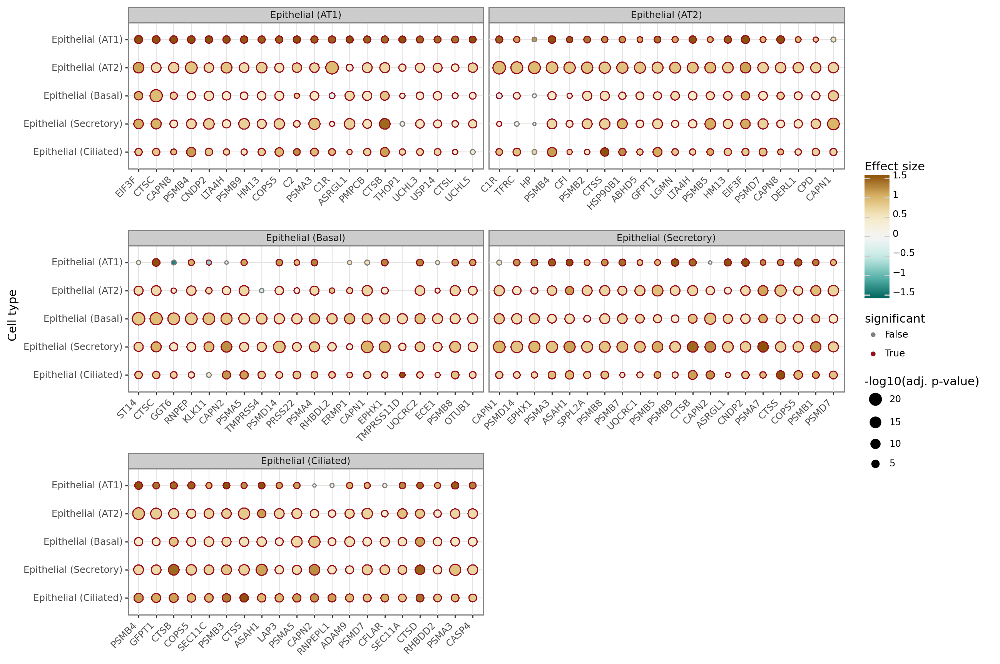

<ggplot: (8731724129572)>


In [57]:
df.loc[df.Estimate < -1.5, 'Estimate'] = -1.5
df.loc[df.Estimate > 1.5, 'Estimate'] = 1.5
#df.loc[df.neglog_pval_adj > 10, 'neglog_pval_adj'] = 10

#df['celltype'] = pd.Categorical(df.celltype, categories = reversed(sorted(df.celltype.unique())))
#df['dataset'] = pd.Categorical(df.dataset, categories = reversed(sorted(df.dataset.unique())))
limit = max(df.Estimate.abs()) * np.array([-1, 1])


g = (
    ggplot(aes(x='tag_gene_celltype', y='celltype'), data=df) +
    geom_point(aes(size='neglog_pval_adj', fill='Estimate', color='significant'))+
    scale_fill_distiller(type='div', limits=limit, name='Effect size') + 
    scale_color_manual(values=('#808080', '#990E1D')) + 
    labs(size = "-log10(adj. p-value)", y='Cell type', x='') +
    guides(size = guide_legend(reverse=True)) +
    theme_bw() +
    facet_wrap('tag_celltype', ncol=2, scales='free_x') +
    scale_size(range = (1,6))+
    #scale_y_discrete(drop=False) + 
    scale_x_discrete(drop=True, 
                     breaks=gene_order_df.gene_celltype.values,
                     labels=lambda x: [y.split('-')[0] for y in x]) + 
    theme(
        panel_spacing_y=0.8,
        figure_size=(12,10),
        legend_key=element_blank(),
        axis_text_x = element_text(rotation=45, hjust=1.),
    )
)

ggsave(g, 'figures/figure-5-supplement-coexpression-dotplot-allcelltypes-top20.pdf', width=12, height=10)
print(g)

## Masked violins

In [22]:
adata_raj.layers['masked'] = adata_raj.X.A
adata_raj.layers['masked'][adata_raj.layers['masked']==0] = np.nan

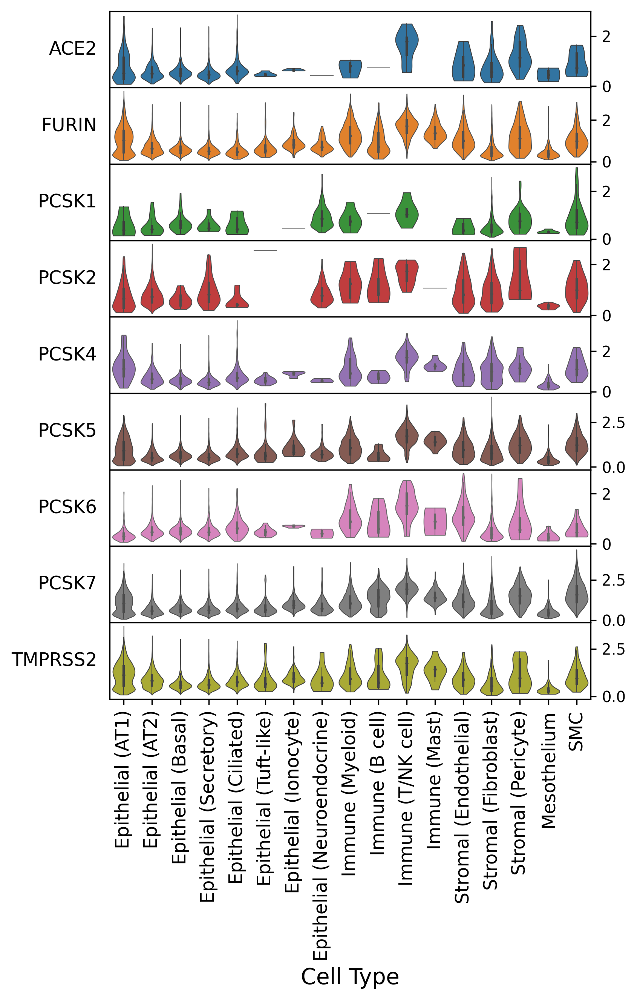

In [23]:
sc.pl.stacked_violin(adata_raj, 
                     ['ACE2'] + genes_volcano,
                     groupby='Cell Type', 
                     swap_axes=True,
                     figsize=(6, 8),
                     scale='width',
                     size=0.2,
                     inner='box',
                     layer='masked',
                     row_palette='tab10',
                     save='figure-5c-violin-nonzero-allcelltypes.pdf');

## Fraction barplots

In [24]:
df = get_expressed(adata_raj, ['ACE2'] + genes_volcano, ['Cell Type'])
df.head()

/home/gokcen/.local/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: Mean of empty slice
  """


,Cell Type,gene,Percent exp.,Mean expression
0,Epithelial (Basal),ACE2,1.346164,0.554802
1,Epithelial (Secretory),ACE2,3.215111,0.484700
2,Epithelial (Ciliated),ACE2,2.508124,0.672256
3,Stromal (Endothelial),ACE2,0.048409,0.839997
4,Epithelial (Neuroendocrine),ACE2,0.256410,0.411162


In [25]:
df[['Cell Type', 'gene', 'Percent exp.']].pivot_table(columns='gene', values='Percent exp.', index='Cell Type')

gene,ACE2,FURIN,PCSK1,PCSK2,PCSK4,PCSK5,PCSK6,PCSK7,TMPRSS2
Cell Type,,,,,,,,,
Epithelial (AT1),0.425147,12.738482,0.021257,0.387947,0.340118,2.630600,0.749322,19.349524,20.024446
Epithelial (AT2),1.627534,22.164207,0.029742,11.163068,0.923646,4.958610,3.104707,19.687382,40.195965
Epithelial (Basal),1.346164,12.792911,0.066330,0.023922,0.912304,10.434404,1.660414,37.175011,10.041863
Epithelial (Secretory),3.215111,13.332664,0.036840,0.227737,2.739542,12.622660,3.667236,39.977898,34.354801
Epithelial (Ciliated),2.508124,2.283143,0.058328,0.074994,9.182569,22.914757,1.899842,20.189983,28.564287
Epithelial (Tuft-like),0.483092,11.594203,0.000000,0.096618,2.318841,3.671498,1.739130,36.521740,7.536232
Epithelial (Ionocyte),0.366748,14.180929,0.122249,0.000000,0.977995,1.833741,0.488998,29.339853,27.506113
Epithelial (Neuroendocrine),0.256410,31.282051,39.743591,27.692308,0.769231,29.230770,0.512821,35.128204,2.564103
Immune (Myeloid),0.011662,13.379980,0.023324,0.054422,0.186589,2.398445,0.163265,11.762877,0.412051


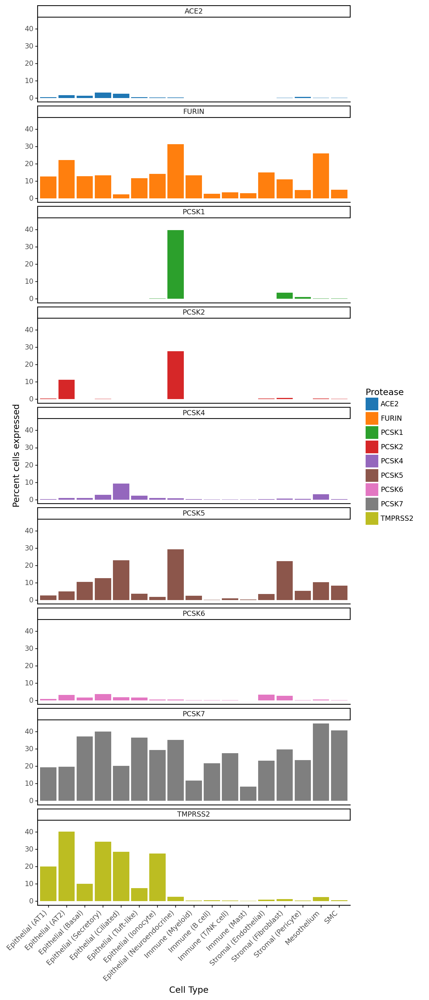

<ggplot: (8728806549182)>

In [144]:
g = (
    ggplot(aes(x='Cell Type', y='Percent exp.', fill='gene'), data=df) + 
    geom_bar(stat='identity', position='dodge') +
    facet_wrap('gene', ncol=1) +
    theme_classic() + 
    theme(figure_size=(7,20), axis_text_x=element_text(rotation=45, hjust=1.)) +
    scale_fill_cmap_d('tab10') +
    labs(x='Cell Type', y='Percent cells expressed', fill='Protease')
)

ggsave(g, 'figures/figure-5d-protease-percent-expressed.pdf', width=7, height=20)
g

## Double positives

In [65]:
genes_volcano

['FURIN', 'PCSK1', 'PCSK2', 'PCSK4', 'PCSK5', 'PCSK6', 'PCSK7', 'TMPRSS2']

In [66]:
for secondgene in genes_volcano:
    adata_raj.obs[f'ACE2+{secondgene}+'] = (adata_raj.obs_vector('ACE2')>0) & (adata_raj.obs_vector(secondgene)>0)

In [67]:
adata_raj.obs.columns

Index(['B_cells', 'ClusterID', 'ClusterName', 'G2M_Score', 'Ionocytes',
       'Neuroendocrine', 'Phase', 'S_Score', 'SeuratClustering', 'T_NK_cells',
       'Tuft_like', 'avg_hkgene', 'batch', 'celltype', 'celltypeN',
       'nCount_RNA', 'nFeature_RNA', 'nGene', 'nUMI', 'n_hkgene', 'old_ident',
       'orig_ident', 'orig_identSec', 'percent_mito', 'res_0_2', 'res_0_4',
       'res_0_6', 'res_0_9', 'res_10', 'res_1_2', 'res_1_5', 'res_1_8',
       'res_2_5', 'res_5', 'typeID', 'ind_id', 'basename', 'gender', 'age',
       'region', 'CellType', 'Region-CellType', 'ACE2/TMPRSS2', 'Cell Type',
       'pd_distalproximal', 'percent_mito_thresh', 'mito_filter',
       'confirmed_smoker', 'n_counts', 'ACE2+', 'ACE2+FURIN+', 'ACE2+PCSK1+',
       'ACE2+PCSK2+', 'ACE2+PCSK4+', 'ACE2+PCSK5+', 'ACE2+PCSK6+',
       'ACE2+PCSK7+', 'ACE2+TMPRSS2+', 'ACE2+ST14+', 'ACE2+CTSL+'],
      dtype='object')

In [ ]:
dp_columns = [f'ACE2+{secondgene}+' for secondgene in genes_volcano]

df = adata_raj.obs.groupby(['Cell Type', 'ind_id', 'gender', 'region', 'orig_identSec'], observed=True)[dp_columns].mean() #.dropna()
df *= 100
df = df.reset_index().rename(columns={k:v for k,v in zip(dp_columns, genes_volcano)})
df.head(20)

In [69]:
df_median = df[genes_volcano + ['Cell Type']].copy().set_index('Cell Type')
df_median[df_median==0] = np.nan
df_median.reset_index().groupby('Cell Type').agg(np.nanmedian)

,FURIN,PCSK1,PCSK2,PCSK4,PCSK5,PCSK6,PCSK7,TMPRSS2
Cell Type,,,,,,,,
Epithelial (AT1),0.299914,NaN,NaN,NaN,0.132802,0.130804,0.257069,0.513404
Epithelial (AT2),0.775194,0.020334,0.557103,0.055604,0.174287,0.081788,0.498575,0.898876
Epithelial (Basal),0.208236,1.075269,NaN,0.049407,0.149721,0.085246,0.743341,0.189394
Epithelial (Secretory),0.620817,NaN,0.764096,0.182415,0.455488,0.213574,1.504630,1.295553
Epithelial (Ciliated),0.374532,NaN,0.092421,0.599237,0.909091,0.879996,1.021149,0.909091
Epithelial (Tuft-like),NaN,NaN,NaN,5.555556,NaN,NaN,5.409357,NaN
Epithelial (Ionocyte),1.333333,NaN,NaN,NaN,NaN,NaN,0.636943,1.333333
Epithelial (Neuroendocrine),NaN,2.777778,NaN,NaN,NaN,NaN,2.777778,NaN
Immune (Myeloid),0.579473,NaN,NaN,NaN,NaN,NaN,0.487805,0.487805


In [70]:
#celltype_nonzero = df.groupby('Cell Type', observed=True)[genes_volcano].sum().sum(1) > 0
#celltype_nonzero = celltype_nonzero[celltype_nonzero].index.values.astype(str)
#celltype_nonzero

In [71]:
#df = df[df['Cell Type'].isin(celltype_nonzero)]

In [72]:
df = df.melt(value_vars=genes_volcano, id_vars=['Cell Type', 'ind_id', 'gender', 'region', 'orig_identSec'], var_name='gene', value_name='DPPercent')

In [73]:
pal = cm.get_cmap(plt.get_cmap('tab10'))
tab10 = [to_hex(x) for x in pal.colors][1:]

In [ ]:
df.head()

In [76]:
adata_raj.obs[['ind_id', 'batch','orig_identSec', 'orig_ident', 'region']].drop_duplicates().sort_values(['ind_id', 'batch', 'orig_ident', 'orig_identSec', 'region']).to_csv('regev-tsankov-sample-info.csv', index=False)

In [77]:
df['sample'] = df.ind_id.astype(str) + '-' + df.orig_identSec.astype(str)

In [78]:
tab10

['#ff7f0e',
 '#2ca02c',
 '#d62728',
 '#9467bd',
 '#8c564b',
 '#e377c2',
 '#7f7f7f',
 '#bcbd22',
 '#17becf']

/home/gokcen/.local/lib/python3.8/site-packages/plotnine/ggplot.py:727: PlotnineWarning: Saving 12 x 20 in image.
  warn("Saving {0} x {1} {2} image.".format(
/home/gokcen/.local/lib/python3.8/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5e-protease-DP.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)
/home/gokcen/.local/lib/python3.8/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/gokcen/.local/lib/python3.8/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


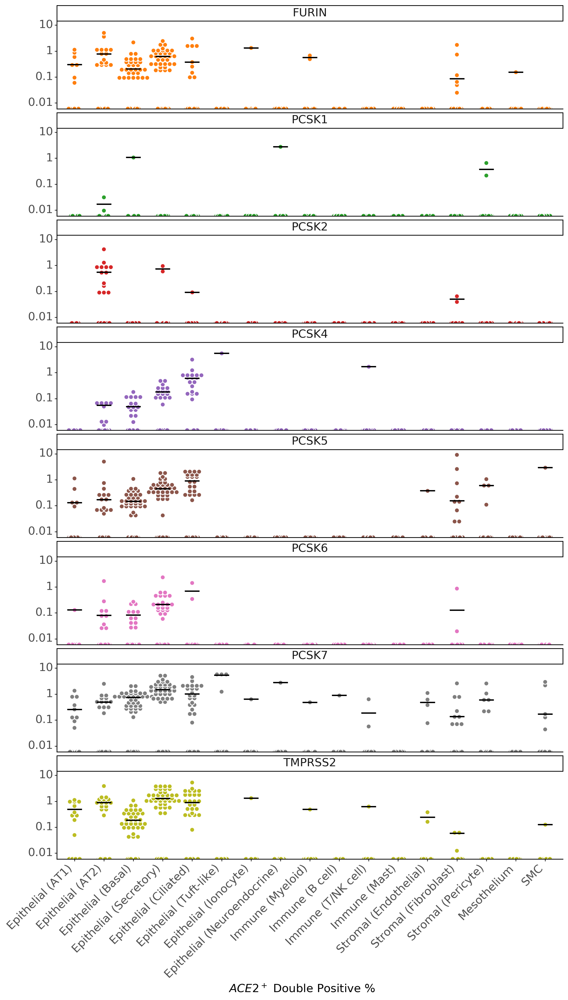

<ggplot: (8777020328337)>

In [79]:
g=(
    ggplot(aes(y='DPPercent', x='Cell Type'), data=df) + 
    geom_jitter(aes(fill='gene'), color='white', height=0, width=0.2, size=3, data=df[df.DPPercent==0]) + 
    geom_dotplot(mapping=aes(fill='gene'), binaxis='y', color='white', position='dodge', bins=30, dotsize=1.8, alpha=1., stackdir='center', data=df[df.DPPercent!=0]) + 
    stat_summary(fun_y = np.median, fun_ymin = np.median, fun_ymax = np.median,  geom = "crossbar", width = 0.5, data=df[df.DPPercent!=0]) +
    theme_classic() + 
    scale_y_continuous(trans='log10') +
    scale_x_discrete(drop=False) +
    facet_wrap('gene', ncol=1) +
    scale_fill_manual(tab10, guide=False) +
    scale_color_manual(tab10, guide=False) +
    theme(figure_size=(12,20), text = element_text(size=15), axis_text_x=element_text(rotation=45, hjust=1.)) + 
    labs(x=f'$ACE2^+$ Double Positive %', y='', fill='')
) 

ggsave(g, 'figures/figure-5e-protease-DP.pdf', width=12, height=20, useDingbats=False)
g

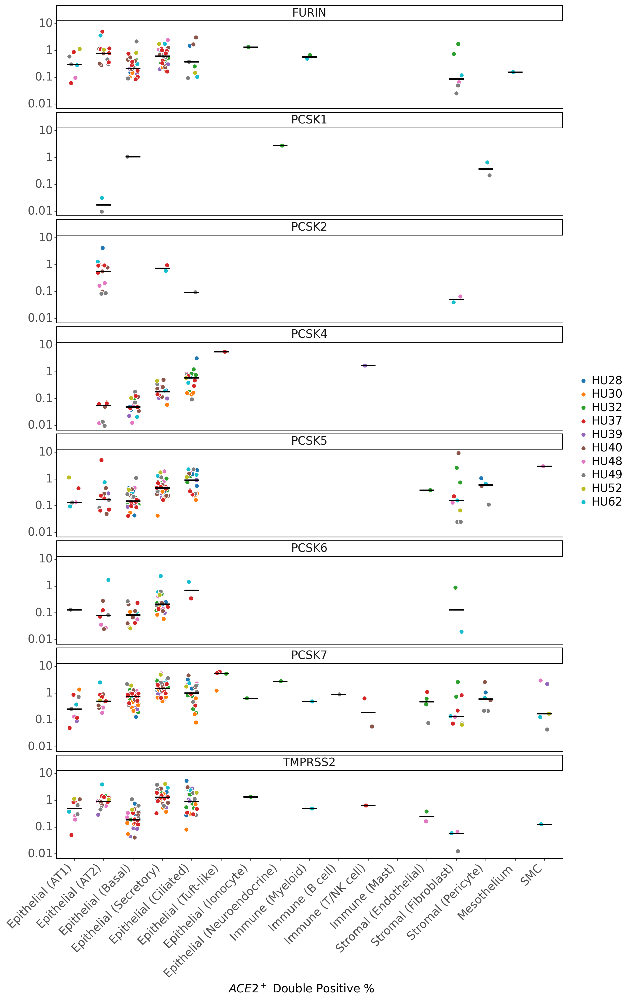

<ggplot: (8786252704246)>

In [81]:
g=(
    ggplot(aes(y='DPPercent', x='Cell Type'), data=df[df.DPPercent!=0]) + 
    geom_jitter(aes(fill='ind_id'), color='white', height=0, width=0.2, size=3) + 
    #geom_dotplot(mapping=aes(fill='ind_id'), binaxis='y', color='white', position='dodge', bins=30, dotsize=1.8, alpha=1., stackdir='center')+ #, data=df[df.DPPercent!=0]) + 
    stat_summary(fun_y = np.median, fun_ymin = np.median, fun_ymax = np.median,  geom = "crossbar", width = 0.5, data=df[df.DPPercent!=0]) +
    theme_classic() + 
    scale_y_continuous(trans='log10') +
    scale_x_discrete(drop=False) +
    facet_wrap('gene', ncol=1) +
    scale_fill_cmap_d('tab10') +
    #scale_color_manual(tab10, guide=False) +
    theme(figure_size=(12,20), text = element_text(size=15), axis_text_x=element_text(rotation=45, hjust=1.)) + 
    labs(x=f'$ACE2^+$ Double Positive %', y='', fill='')
) 

g

## Triple positives

In [81]:
genes_volcano

['FURIN', 'PCSK1', 'PCSK2', 'PCSK4', 'PCSK5', 'PCSK6', 'PCSK7', 'TMPRSS2']

In [82]:
for secondgene in genes_volcano[:-1] + ['CTSL']:
    adata_raj.obs[f'ACE2+TMPRSS2+{secondgene}+'] = (adata_raj.obs_vector('ACE2')>0) & (adata_raj.obs_vector('TMPRSS2')>0) & (adata_raj.obs_vector(secondgene)>0)

In [83]:
adata_raj.obs.columns

Index(['B_cells', 'ClusterID', 'ClusterName', 'G2M_Score', 'Ionocytes',
       'Neuroendocrine', 'Phase', 'S_Score', 'SeuratClustering', 'T_NK_cells',
       'Tuft_like', 'avg_hkgene', 'batch', 'celltype', 'celltypeN',
       'nCount_RNA', 'nFeature_RNA', 'nGene', 'nUMI', 'n_hkgene', 'old_ident',
       'orig_ident', 'orig_identSec', 'percent_mito', 'res_0_2', 'res_0_4',
       'res_0_6', 'res_0_9', 'res_10', 'res_1_2', 'res_1_5', 'res_1_8',
       'res_2_5', 'res_5', 'typeID', 'ind_id', 'basename', 'gender', 'age',
       'region', 'CellType', 'Region-CellType', 'ACE2/TMPRSS2', 'Cell Type',
       'pd_distalproximal', 'percent_mito_thresh', 'mito_filter',
       'confirmed_smoker', 'n_counts', 'ACE2+', 'ACE2+FURIN+', 'ACE2+PCSK1+',
       'ACE2+PCSK2+', 'ACE2+PCSK4+', 'ACE2+PCSK5+', 'ACE2+PCSK6+',
       'ACE2+PCSK7+', 'ACE2+TMPRSS2+', 'ACE2+ST14+', 'ACE2+CTSL+',
       'ACE2+TMPRSS2+FURIN+', 'ACE2+TMPRSS2+PCSK1+', 'ACE2+TMPRSS2+PCSK2+',
       'ACE2+TMPRSS2+PCSK4+', 'ACE2+TMPRSS2+PCS

In [ ]:
dp_columns = [f'ACE2+TMPRSS2+{secondgene}+' for secondgene in genes_volcano[:-1] + ['CTSL']]

df = adata_raj.obs.groupby(['Cell Type', 'ind_id', 'gender', 'region', 'orig_identSec'], observed=True)[dp_columns].mean().dropna()
df *= 100
df = df.reset_index().rename(columns={k:v for k,v in zip(dp_columns, genes_volcano[:-1]+['CTSL'])})
df.head(20)

In [97]:
df_median = df[genes_volcano[:-1] + ['Cell Type']].copy().set_index('Cell Type')
df_median[df_median==0] = np.nan
df_median.reset_index().groupby('Cell Type').agg(np.nanmedian)

,FURIN,PCSK1,PCSK2,PCSK4,PCSK5,PCSK6,PCSK7
Cell Type,,,,,,,
Epithelial (AT1),0.224001,NaN,NaN,NaN,0.132802,NaN,0.261609
Epithelial (AT2),0.356125,NaN,0.284900,0.063827,0.094719,0.054908,0.284900
Epithelial (Basal),0.089286,1.075269,NaN,0.049407,0.068306,0.046683,0.142146
Epithelial (Secretory),0.251605,NaN,NaN,0.137741,0.297915,0.231512,0.724422
Epithelial (Ciliated),0.374532,NaN,NaN,0.502577,0.412371,0.644330,0.751880
Epithelial (Tuft-like),NaN,NaN,NaN,NaN,NaN,NaN,NaN
Epithelial (Ionocyte),1.333333,NaN,NaN,NaN,NaN,NaN,NaN
Epithelial (Neuroendocrine),NaN,NaN,NaN,NaN,NaN,NaN,NaN
Immune (Myeloid),0.487805,NaN,NaN,NaN,NaN,NaN,0.487805


In [98]:
df = df.melt(value_vars=genes_volcano[:-1]+['CTSL'], id_vars=['Cell Type', 'ind_id', 'gender', 'region', 'orig_identSec'], var_name='gene', value_name='TPPercent')

In [99]:
pal = cm.get_cmap(plt.get_cmap('tab10'))
tab10 = [to_hex(x) for x in pal.colors][1:]

In [100]:
tab10

['#ff7f0e',
 '#2ca02c',
 '#d62728',
 '#9467bd',
 '#8c564b',
 '#e377c2',
 '#7f7f7f',
 '#bcbd22',
 '#17becf']

In [102]:
df['sample'] = df.ind_id.astype(str) + '-' + df.orig_identSec.astype(str)

In [106]:
df['gene'] = pd.Categorical(df.gene, categories=['FURIN', 'PCSK1', 'PCSK2', 'PCSK4', 'PCSK5', 'PCSK6', 'PCSK7','CTSL'])

/home/gokcen/.local/lib/python3.8/site-packages/plotnine/ggplot.py:727: PlotnineWarning: Saving 12 x 20 in image.
  warn("Saving {0} x {1} {2} image.".format(
/home/gokcen/.local/lib/python3.8/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5-supplement-protease-TP-withCTSL.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)
/home/gokcen/.local/lib/python3.8/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/gokcen/.local/lib/python3.8/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


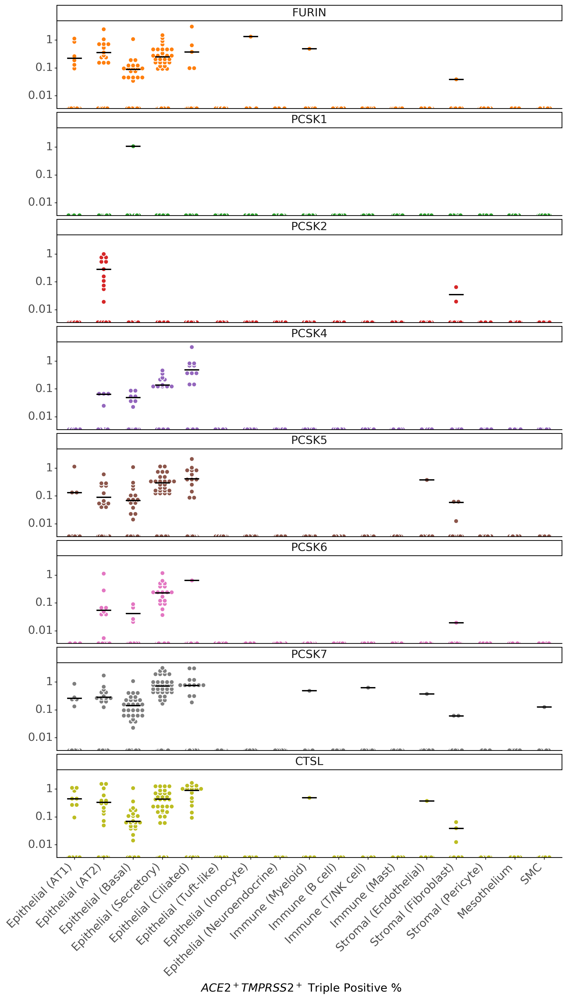

<ggplot: (8777089960226)>

In [107]:
g=(
    ggplot(aes(y='TPPercent', x='Cell Type'), data=df) + 
    geom_jitter(aes(fill='gene'), color='white', height=0, width=0.2, size=3, data=df[df.TPPercent==0]) + 
    geom_dotplot(mapping=aes(fill='gene'), binaxis='y', color='white', position='dodge', bins=30, dotsize=1.8, alpha=1., stackdir='center', data=df[df.TPPercent!=0]) + 
    stat_summary(fun_y = np.median, fun_ymin = np.median, fun_ymax = np.median,  geom = "crossbar", width = 0.5, data=df[df.TPPercent!=0]) +
    theme_classic() + 
    scale_y_continuous(trans='log10') +
    facet_wrap('gene', ncol=1) +
    scale_fill_manual(tab10, guide=False) +
    scale_color_manual(tab10, guide=False) +
    theme(figure_size=(12,20), text = element_text(size=15), axis_text_x=element_text(rotation=45, hjust=1.)) + 
    labs(x=f'$ACE2^+TMPRSS2^+$ Triple Positive %', y='', fill='')
) 

ggsave(g, 'figures/figure-5-supplement-protease-TP-withCTSL.pdf', width=12, height=20, useDingbats=False)
g

# European dataset

In [ ]:
adata_eur = sc.read('lca-processed-harmony.h5ad')
adata_eur

In [ ]:
adata_eur.obs

In [ ]:
adata_eur.obs[['age', 'patient', 'sample', 'sex', 'dataset']].drop_duplicates().sort_values(['dataset', 'sample', 'patient', 'age']).reset_index(drop=True)

In [18]:
adata_eur.obs.dataset.cat.categories

Index(['Groningen_Nawijn_2019VieiraBraga', 'Misharin_new',
       'Northwestern_Misharin_2018Reyfman', 'Pittsburgh_Lafyatis_2019Morse',
       'Sanger_Meyer_2019Madissoon', 'Vanderbilt_Kropski_bioRxivHabermann'],
      dtype='object')

In [19]:
adata_eur.obs[['sample', 'sex', 'age', 'dataset']].drop_duplicates().shape

(40, 4)

In [20]:
c2c = {
    
 'AT1': 'Epithelial (AT1)',
 'AT2': 'Epithelial (AT2)',
 'Transitional AT2': 'Epithelial (Transitional AT2)',
 '3_Basal': 'Epithelial (Basal)',
 'Basal cycling': 'Epithelial (Basal)',
 'Basal diff?': 'Epithelial (Basal)',
 'Basal resting': 'Epithelial (Basal)',
 'Suprabasal': 'Epithelial (Suprabasal)',
 '3_Ciliated lineage': 'Epithelial (Ciliated)',
 'Differentiating Ciliated': 'Epithelial (Ciliated)',
 'Ciliated': 'Epithelial (Ciliated)',
 '3_Secretory': 'Epithelial (Secretory)',
 '3_Submucosal Secretory': 'Epithelial (Submucosal secretory)',
 'Mucous': 'Epithelial (Mucous)',
 'Mucous ciliated': 'Epithelial (Mucous, ciliated)',
 'Club': 'Epithelial (Club)',
 'Goblet-1': 'Epithelial (Goblet)',
 'Ionocyte': 'Epithelial (Ionocytes)',
 'Neuroendocrine': 'Epithelial (Neuroendocrine)',
 'Serous': 'Epithelial (Serous)',    
 '2_Proliferating Epithelial Cells': 'Epithelial (Cycling)',
 '3_Epithelial cells, proliferating': 'Epithelial (Cycling)',

 '3_B cell lineage': 'Immune (B cell)',
 'B cells': 'Immune (B cell)',    
 'Plasma cells': 'Immune (Plasma)',
 'CD4 T cells': 'Immune (T cell)',
 'CD8 T cells': 'Immune (T cell)',
 '3_T cell lineage': 'Immune (T cell)',
 'T_cells_Dividing': 'Immune (T cell)',
 'Tregs': 'Immune (Treg)',
 'NK cells': 'Immune (NK cell)',
 '2_Lymphoid': 'Immune (Lymphoid)',
 '3_Monocytes': 'Immune (Monocyte)',
 'Classical monocytes': 'Immune (Monocyte)',
 'Intermediate monocytes': 'Immune (Monocyte)',
 'Non-classical monocytes': 'Immune (Monocyte)',
 '1 SPP1hi Macrophage': 'Immune (Macrophage)',
 '3_Macrophages': 'Immune (Macrophage)',
 'Proliferating Macrophages': 'Immune (Macrophage)',
 'Alveolar macrophages': 'Immune (Alveolar macrophage)',    
 '2_Granulocytes': 'Immune (Granulocytes)',
 '3_Dendritic cells': 'Immune (DC)',
 'DC1': 'Immune (DC)',
 'DC2': 'Immune (DC)',
 'DC_Monocyte_Dividing': 'Immune (DC)',
 'DC_activated': 'Immune (DC)',
 'plasmacytoid DC': 'Immune (DC)',
 '3_Innate lymphoid cells': 'Immune (ILC)',
 'ILC2s': 'Immune (ILC2)',
 '3_Mast cells': 'Immune (Mast)',
    
 '3_Fibroblasts': 'Stromal (Fibroblast)',
 'PLIN2+ Fibroblasts': 'Stromal (Fibroblast)',
 '1_Stroma': 'Stromal',    
 'Pericytes': 'Stromal (Pericyte)',
 'Myofibroblasts': 'Stromal (Myofibroblast)',
    
 '2_Smooth Muscle': 'SMC',
 '3_Airway smooth muscle': 'SMC (airway)',
 '3_Mesothelium': 'Mesothelium',
 'Arterial EC': 'Arterial EC',
 'Lymphatic EC': 'Lymphatic EC',
 'Venous EC': 'Venous EC',

 '2_Blood vessels': 'Blood vessels',
 '2_Cycling cells': 'Cycling',    
    
 'MUC5AC+ High': 'None',
 'MUC5B+': 'None',    
 'None': 'None',
 'Not alveolar macrophages': 'None',
 'SC84_C11_Macrophages_mixed_cluster': 'None',
 'SC88_C10_Basal_cells_TP63': 'None',
 'SC88_C15_Basal_activated': 'None',
 'SC88_C16_SMG_MUC5Blow_DEFB1': 'None',
 'SC88_C17_KRT13_cornified': 'None',
 'SCGB3A2+ SCGB1A1+': 'None',
 '1_Unicorns and artifacts': 'None',
}

In [21]:
celltypes_ordered = pd.Series(list(c2c.values())).unique().tolist()

adata_eur.obs['Cell Type'] = pd.Categorical([c2c[x] for x in adata_eur.obs['ann_level_4']], categories=celltypes_ordered)
exclude_ct = ['None', 'Cycling']

adata_eur = adata_eur[~adata_eur.obs['Cell Type'].isin(exclude_ct)].copy()

In [22]:
adata_eur.obs.dataset.cat.categories

Index(['Groningen_Nawijn_2019VieiraBraga', 'Misharin_new',
       'Northwestern_Misharin_2018Reyfman', 'Pittsburgh_Lafyatis_2019Morse',
       'Sanger_Meyer_2019Madissoon', 'Vanderbilt_Kropski_bioRxivHabermann'],
      dtype='object')

In [23]:
sorted(adata_eur.obs['Cell Type'].unique())

['Arterial EC',
 'Blood vessels',
 'Epithelial (AT1)',
 'Epithelial (AT2)',
 'Epithelial (Basal)',
 'Epithelial (Ciliated)',
 'Epithelial (Club)',
 'Epithelial (Cycling)',
 'Epithelial (Goblet)',
 'Epithelial (Ionocytes)',
 'Epithelial (Mucous)',
 'Epithelial (Mucous, ciliated)',
 'Epithelial (Neuroendocrine)',
 'Epithelial (Secretory)',
 'Epithelial (Serous)',
 'Epithelial (Submucosal secretory)',
 'Epithelial (Suprabasal)',
 'Epithelial (Transitional AT2)',
 'Immune (Alveolar macrophage)',
 'Immune (B cell)',
 'Immune (DC)',
 'Immune (Granulocytes)',
 'Immune (ILC)',
 'Immune (ILC2)',
 'Immune (Lymphoid)',
 'Immune (Macrophage)',
 'Immune (Mast)',
 'Immune (Monocyte)',
 'Immune (NK cell)',
 'Immune (Plasma)',
 'Immune (T cell)',
 'Immune (Treg)',
 'Lymphatic EC',
 'Mesothelium',
 'SMC',
 'SMC (airway)',
 'Stromal',
 'Stromal (Fibroblast)',
 'Stromal (Myofibroblast)',
 'Stromal (Pericyte)',
 'Venous EC']

In [24]:
adata_eur.obs.dataset.unique()

[Sanger_Meyer_2019Madissoon, Northwestern_Misharin_2018Reyfman, Pittsburgh_Lafyatis_2019Morse, Vanderbilt_Kropski_bioRxivHabermann, Groningen_Nawijn_2019VieiraBraga, Misharin_new]
Categories (6, object): [Sanger_Meyer_2019Madissoon, Northwestern_Misharin_2018Reyfman, Pittsburgh_Lafyatis_2019Morse, Vanderbilt_Kropski_bioRxivHabermann, Groningen_Nawijn_2019VieiraBraga, Misharin_new]

In [64]:
adata_eur.obs['ACE2+'] = adata_eur.obs_vector('ACE2')>0

for d in adata_eur.obs.dataset.cat.categories:
    print(d)
    ad = adata_eur[adata_eur.obs.dataset == d]
    display(pd.crosstab(ad.obs['ACE2+'], ad.obs['Cell Type']))
    display(pd.crosstab(ad.obs['ACE2+'], ad.obs['Cell Type']).sum(0))

## Fit models

In [65]:
interesting_genes = np.array(proteases)[np.isin(proteases, adata_eur.var_names.unique())].tolist()

In [66]:
adata_eur.obs['dataset_sample'] = adata_eur.obs.dataset.astype(str) + '-' + adata_eur.obs['sample'].astype(str)
adata_eur.obs['dataset_sample'] = adata_eur.obs['dataset_sample'].astype('category')

In [68]:
results = fit_coexpression_model(adata_eur, 'lung_cell_atlas_aggregated', 'ACE2', interesting_genes, 'Cell Type', 'dataset_sample')

*** Dataset:                                   lung_cell_atlas_aggregated Group:                         Epithelial (AT1) # genes:   247 # cells:     32 ***
*** Dataset:                                   lung_cell_atlas_aggregated Group:                         Epithelial (AT2) # genes:   379 # cells:   1026 ***
*** Dataset:                                   lung_cell_atlas_aggregated Group:            Epithelial (Transitional AT2) # genes:   141 # cells:     14 ***
*** Dataset:                                   lung_cell_atlas_aggregated Group:                       Epithelial (Basal) # genes:   350 # cells:    196 ***
*** Dataset:                                   lung_cell_atlas_aggregated Group:                  Epithelial (Suprabasal) # genes:   344 # cells:    142 ***
*** Dataset:                                   lung_cell_atlas_aggregated Group:                    Epithelial (Ciliated) # genes:   371 # cells:    340 ***
*** Dataset:                                   lung_cell_a

In [69]:
results.to_csv('tables/figure-5-supplementary-table-lung_cell_atlas-binomial_glmm-celltypes.csv', index=False)

In [22]:
results = pd.read_csv('tables/figure-5-supplementary-table-lung_cell_atlas-binomial_glmm-celltypes.csv')

In [23]:
results.head()

,fixed_effect,Estimate,Std. Error,z value,Pr(>|z|),gene,significant,pval_adj,neglog_pval_adj,celltype,dataset
0,binACE2,0.356733,0.002925,121.978859,0.0,CASP2,True,0.0,300.0,Epithelial (Club),lung_cell_atlas_aggregated
1,binACE2,0.763930,0.002091,365.384106,0.0,PCSK5,True,0.0,300.0,Epithelial (AT2),lung_cell_atlas_aggregated
2,binACE2,-0.673412,0.004378,-153.833373,0.0,BACE1,True,0.0,300.0,Epithelial (Suprabasal),lung_cell_atlas_aggregated
3,binACE2,8.670738,0.007606,1139.956241,0.0,CTSZ,True,0.0,300.0,Epithelial (Secretory),lung_cell_atlas_aggregated
4,binACE2,19.624456,0.002785,7047.496408,0.0,PSMB5,True,0.0,300.0,Epithelial (Secretory),lung_cell_atlas_aggregated


In [26]:
sorted(results.celltype.unique())

['Epithelial (AT1)',
 'Epithelial (AT2)',
 'Epithelial (Basal)',
 'Epithelial (Ciliated)',
 'Epithelial (Club)',
 'Epithelial (Goblet)',
 'Epithelial (Mucous)',
 'Epithelial (Secretory)',
 'Epithelial (Suprabasal)',
 'Epithelial (Transitional AT2)',
 'SMC']

In [27]:
celltype_order = [
    'Epithelial (AT1)',
    'Epithelial (AT2)',
    'Epithelial (Transitional AT2)',
    'Epithelial (Basal)',
    'Epithelial (Suprabasal)',
    'Epithelial (Ciliated)',
    'Epithelial (Club)',
    'Epithelial (Secretory)',
    'Epithelial (Goblet)',
    'Epithelial (Mucous)',
    'Epithelial (Mucous, ciliated)',
    'Epithelial (Submucosal secretory)',
    'Epithelial (Cycling)',
]

In [28]:
df = results[results.celltype.str.startswith('Epithelial')].copy()
df['furin'] = df.gene.isin(genes_volcano)
#df['celltype'] = [x[(x.index('(')+1):x.index(')')] for x in df['celltype']]
df['gene_celltype'] = [f'{x} ({y})' for x,y in zip(df.gene, df.celltype)]
df.head()

,fixed_effect,Estimate,Std. Error,z value,Pr(>|z|),gene,significant,pval_adj,neglog_pval_adj,celltype,dataset,furin,gene_celltype
0,binACE2,0.356733,0.002925,121.978859,0.0,CASP2,True,0.0,300.0,Epithelial (Club),lung_cell_atlas_aggregated,False,CASP2 (Epithelial (Club))
1,binACE2,0.763930,0.002091,365.384106,0.0,PCSK5,True,0.0,300.0,Epithelial (AT2),lung_cell_atlas_aggregated,True,PCSK5 (Epithelial (AT2))
2,binACE2,-0.673412,0.004378,-153.833373,0.0,BACE1,True,0.0,300.0,Epithelial (Suprabasal),lung_cell_atlas_aggregated,False,BACE1 (Epithelial (Suprabasal))
3,binACE2,8.670738,0.007606,1139.956241,0.0,CTSZ,True,0.0,300.0,Epithelial (Secretory),lung_cell_atlas_aggregated,False,CTSZ (Epithelial (Secretory))
4,binACE2,19.624456,0.002785,7047.496408,0.0,PSMB5,True,0.0,300.0,Epithelial (Secretory),lung_cell_atlas_aggregated,False,PSMB5 (Epithelial (Secretory))


In [29]:
df['celltype'] = pd.Categorical(df.celltype, categories=celltype_order)
df.celltype.cat.remove_unused_categories(inplace=True)
df.celltype.cat.categories

Index(['Epithelial (AT1)', 'Epithelial (AT2)', 'Epithelial (Transitional AT2)',
       'Epithelial (Basal)', 'Epithelial (Suprabasal)',
       'Epithelial (Ciliated)', 'Epithelial (Club)', 'Epithelial (Secretory)',
       'Epithelial (Goblet)', 'Epithelial (Mucous)'],
      dtype='object')

/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 7 x 7 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5-supplement-coexpression-volcano-lung_cell_atlas_nofilter.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/layer.py:464: PlotnineWarning: geom_point : Removed 10 rows containing missing values.
  self.data = self.geom.handle_na(self.data)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/layer.py:464: PlotnineWarning: geom_point : Removed 113 rows containing missing values.
  self.data = self.geom.handle_na(self.data)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/layer.py:464: PlotnineWarning: geom_point : Removed 10 rows containing missing values.
  self.data = self.geom.handle_na(self.data)
/home/gokcen/.local/lib/python3

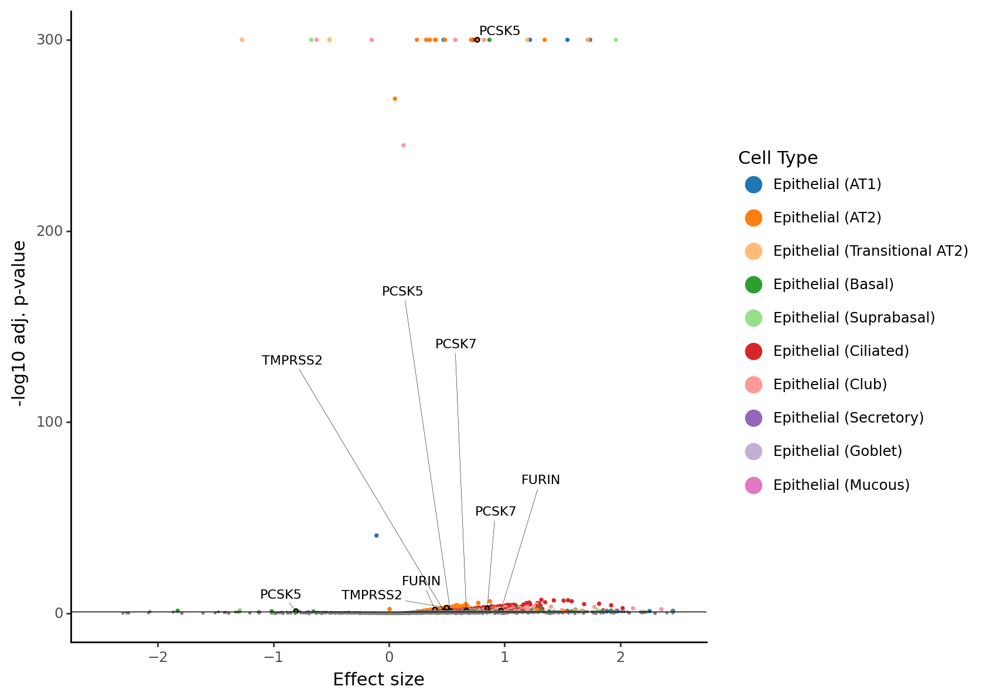

<ggplot: (8775703553782)>

In [30]:
df_text_idx = (df.furin) & (df.significant) #& (df.neglog_pval_adj>1.1) & (df.logodds>0.3)
#df.neglog_pval_adj.loc[df.neglog_pval_adj>40] = np.inf

g = (
    ggplot(aes(x='Estimate', y='neglog_pval_adj'), data=df[df.significant]) + 
    geom_point(aes(color='celltype'), size=0.5, data=df[(~df.furin) & (df.significant)]) +
    geom_point(aes(fill='celltype'), color='black', size=1., data=df[df_text_idx]) +
    geom_point(size=0.05,
               data=df[~df.significant], color='gray') +
    geom_text(aes(label='gene'), 
              size=8,
              color='black', 
              fontweight='normal',
              data=df[df_text_idx],
              adjust_text={'arrowprops': {'arrowstyle': '-', 'lw':0.2}, 'x':df.Estimate.values, 'y':df.neglog_pval_adj.values, 'expand_points': (0.5,1.5)}
             ) + 
    geom_hline(yintercept=1, size=0.3) +
    theme_classic() + 
    theme(figure_size=(7,7)) +
    labs(x='Effect size', y='-log10 adj. p-value', color='Cell Type') +
    scale_color_manual(values=type2color) + lims(x=[-2.5,2.5]) +
    scale_fill_manual(values=type2color) +
    guides(color = guide_legend(override_aes = dict(size=5)), fill=None)
)

ggsave(g, 'figures/figure-5-supplement-coexpression-volcano-lung_cell_atlas_nofilter.pdf', width=7, height=7, useDingbats=False)

g

/home/gokcen/.local/lib/python3.7/site-packages/pandas/core/indexing.py:202: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 7 x 7 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5-supplement-coexpression-volcano-lung_cell_atlas.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/layer.py:464: PlotnineWarning: geom_point : Removed 10 rows containing missing values.
  self.data = self.geom.handle_na(self.data)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/layer.py:4

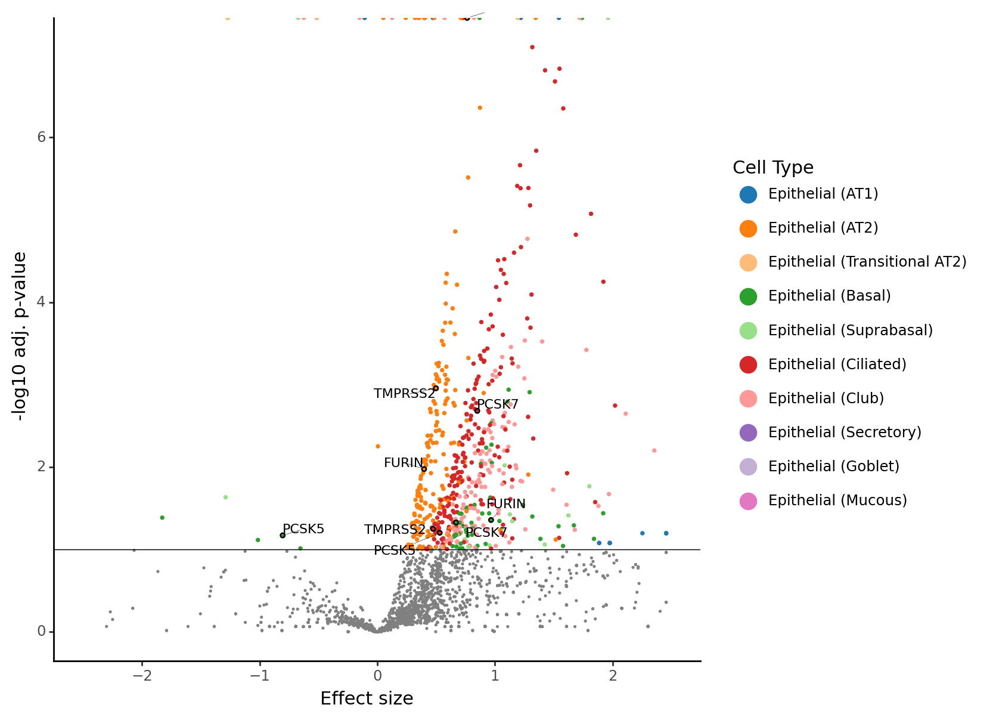

<ggplot: (-9223363261170193422)>

In [31]:
df_text_idx = (df.furin) & (df.significant) #& (df.neglog_pval_adj>1.1) & (df.logodds>0.3)
df.neglog_pval_adj.loc[df.neglog_pval_adj>40] = np.inf

g = (
    ggplot(aes(x='Estimate', y='neglog_pval_adj'), data=df[df.significant]) + 
    geom_point(aes(color='celltype'), size=0.5, data=df[(~df.furin) & (df.significant)]) +
    geom_point(aes(fill='celltype'), color='black', size=1., data=df[df_text_idx]) +
    geom_point(size=0.05,
               data=df[~df.significant], color='gray') +
    geom_text(aes(label='gene'), 
              size=8,
              color='black', 
              fontweight='normal',
              data=df[df_text_idx],
              adjust_text={'arrowprops': {'arrowstyle': '-', 'lw':0.2}, 'x':df.Estimate.values, 'y':df.neglog_pval_adj.values, 'expand_points': (0.5,1.5)}
             ) + 
    geom_hline(yintercept=1, size=0.3) +
    theme_classic() + 
    theme(figure_size=(7,7)) +
    labs(x='Effect size', y='-log10 adj. p-value', color='Cell Type') +
    scale_color_manual(values=type2color) + lims(x=[-2.5,2.5]) +
    scale_fill_manual(values=type2color) +
    guides(color = guide_legend(override_aes = dict(size=5)), fill=None)
)

ggsave(g, 'figures/figure-5-supplement-coexpression-volcano-lung_cell_atlas.pdf', width=7, height=7, useDingbats=False)

g

celltypes_ordered = [
 'Epithelial (AT1)',
 'Epithelial (AT2)',
 'Epithelial (Transitional AT2)',
 'Epithelial (Basal)',
 'Epithelial (Suprabasal)',
 'Epithelial (Ciliated)',
 'Epithelial (Secretory)',
 'Epithelial (Submucosal secretory)',
 'Epithelial (Club)',
 'Epithelial (Goblet)',
 'Epithelial (Mucous)', 
 'Epithelial (Mucous, ciliated)',
 'Epithelial (Ionocytes)',
 'Epithelial (Neuroendocrine)',
 'Epithelial (Serous)',
 'Epithelial (Cycling)',
 'Immune (B cell)',
 'Immune (Plasma)',
 'Immune (T cell)',
 'Immune (Treg)',
 'Immune (NK cell)',
 'Immune (Lymphoid)',
 'Immune (Monocyte)',
 'Immune (Macrophage)',
 'Immune (Alveolar macrophage)',
 'Immune (Granulocytes)',
 'Immune (DC)',
 'Immune (ILC)',
 'Immune (ILC2)',
 'Immune (Mast)',
 'Stromal (Fibroblast)',
 'Stromal (Myofibroblast)',
 'Stromal',
 'Stromal (Pericyte)',
 'SMC',
 'SMC (airway)',
 'Mesothelium',
 'Arterial EC',
 'Lymphatic EC',
 'Venous EC',
 'Serous',
 'Mucous',
 'Mucous (ciliated)',
 'Myofibroblast',
 'Blood vessels',
 'Cycling',
 'None'
]

In [32]:
genes

['FURIN',
 'PCSK1',
 'PCSK2',
 'PCSK4',
 'PCSK5',
 'PCSK6',
 'PCSK7',
 'TMPRSS2',
 'CTSL']

## Dot plots

In [35]:
celltypes_ordered

['Epithelial (AT1)',
 'Epithelial (AT2)',
 'Epithelial (Transitional AT2)',
 'Epithelial (Basal)',
 'Epithelial (Suprabasal)',
 'Epithelial (Ciliated)',
 'Epithelial (Secretory)',
 'Epithelial (Submucosal secretory)',
 'Epithelial (Mucous)',
 'Epithelial (Mucous, ciliated)',
 'Epithelial (Club)',
 'Epithelial (Goblet)',
 'Epithelial (Ionocytes)',
 'Epithelial (Neuroendocrine)',
 'Epithelial (Serous)',
 'Epithelial (Cycling)',
 'Immune (B cell)',
 'Immune (Plasma)',
 'Immune (T cell)',
 'Immune (Treg)',
 'Immune (NK cell)',
 'Immune (Lymphoid)',
 'Immune (Monocyte)',
 'Immune (Macrophage)',
 'Immune (Alveolar macrophage)',
 'Immune (Granulocytes)',
 'Immune (DC)',
 'Immune (ILC)',
 'Immune (ILC2)',
 'Immune (Mast)',
 'Stromal (Fibroblast)',
 'Stromal',
 'Stromal (Pericyte)',
 'Stromal (Myofibroblast)',
 'SMC',
 'SMC (airway)',
 'Mesothelium',
 'Arterial EC',
 'Lymphatic EC',
 'Venous EC',
 'Blood vessels',
 'Cycling',
 'None']

In [36]:
df = results.copy()

df = df[df.celltype!='None']
df = df[df.gene.isin(genes)]
df['celltype'] = pd.Categorical(df.celltype, categories=reversed(celltypes_ordered[:-2]))
df['gene'] = pd.Categorical(df.gene, categories=(genes))

In [37]:
df.celltype.unique()[~np.isin(df.celltype.unique(), celltypes_ordered)]

[], Categories (11, object): [Epithelial (AT2), Epithelial (Ciliated), Epithelial (Basal), Epithelial (Club), ..., Epithelial (Transitional AT2), SMC, Epithelial (Mucous), Epithelial (Goblet)]

/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 5 x 12 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5-supplement-coexpression-dotplot.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)


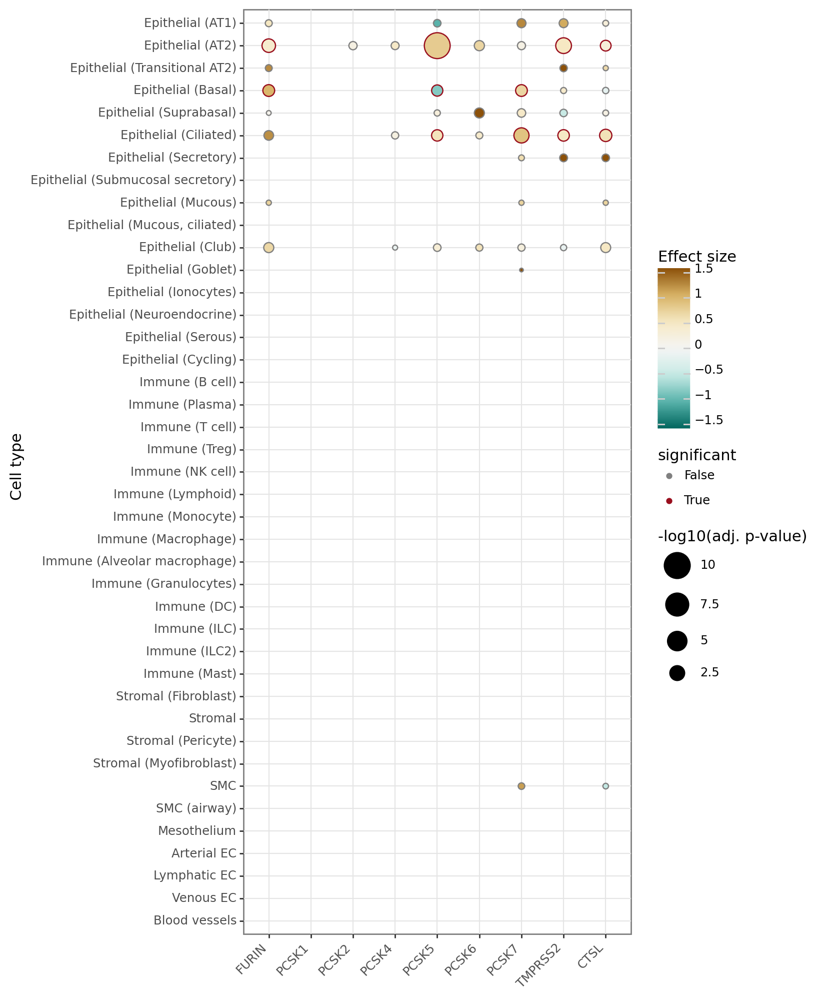

<ggplot: (8775684454860)>


In [38]:
df.loc[df.Estimate < -1.5, 'Estimate'] = -1.5
df.loc[df.Estimate > 1.5, 'Estimate'] = 1.5
df.loc[df.neglog_pval_adj > 10, 'neglog_pval_adj'] = 10

#df['celltype'] = pd.Categorical(df.celltype, categories = reversed(sorted(df.celltype.unique())))
#df['dataset'] = pd.Categorical(df.dataset, categories = reversed(sorted(df.dataset.unique())))
limit = max(df.Estimate.abs()) * np.array([-1, 1])


g = (
    ggplot(aes(x='gene', y='celltype'), data=df) +
    geom_point(aes(size='neglog_pval_adj', fill='Estimate', color='significant'))+
    scale_fill_distiller(type='div', limits=limit, name='Effect size') + 
    scale_color_manual(values=('#808080', '#990E1D')) + 
    labs(size = "-log10(adj. p-value)", y='Cell type', x='') +
    guides(size = guide_legend(reverse=True)) +
    theme_bw() +
    scale_size(range = (1,10))+
    scale_y_discrete(drop=False) + 
    scale_x_discrete(drop=False) + 
    theme(
      figure_size=(5,12),
      legend_key=element_blank(),
      axis_text_x = element_text(rotation=45, hjust=1.),
    )
)

ggsave(g, 'figures/figure-5-supplement-coexpression-dotplot.pdf', width=5, height=12)
print(g)

In [415]:
df = get_expressed(adata_eur, ['ACE2'] + genes_volcano, ['Cell Type'])
df.head()

/home/gokcen/.local/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: Mean of empty slice
  """


,Cell Type,gene,Percent exp.,Mean expression
0,Immune (B cell),ACE2,0.000000,0.000000
1,Immune (T cell),ACE2,0.010483,1.770077
2,Epithelial (AT2),ACE2,1.553087,0.696638
3,Immune (Monocyte),ACE2,0.000000,0.000000
4,Immune (Alveolar macrophage),ACE2,0.008050,0.767574


/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 12 x 20 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5-supplement-protease-percent-expressed-european.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)


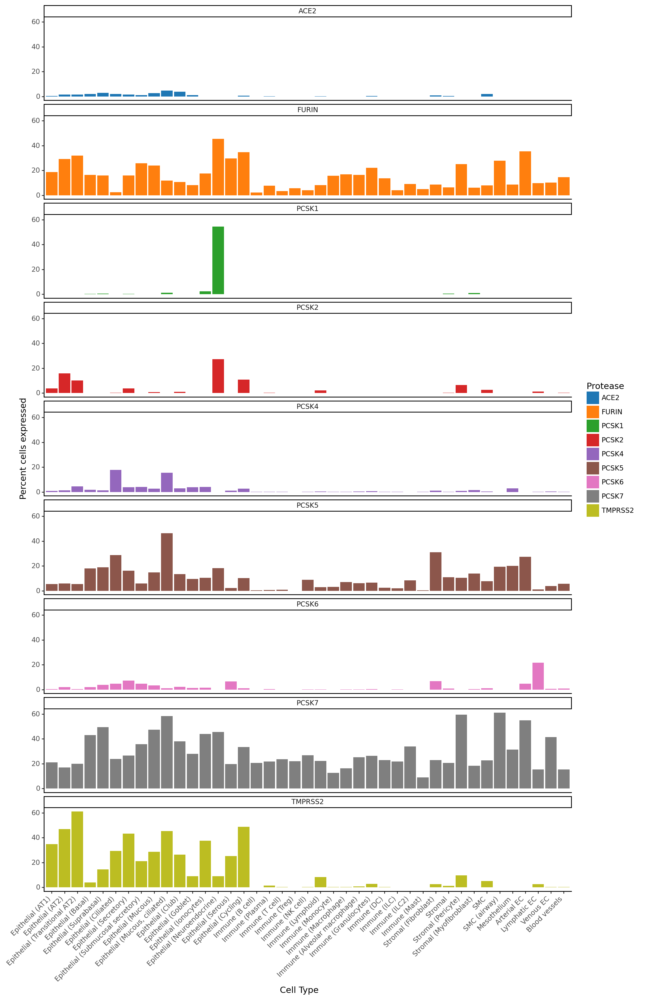

<ggplot: (8728934275392)>

In [416]:
g = (
    ggplot(aes(x='Cell Type', y='Percent exp.', fill='gene'), data=df) + 
    geom_bar(stat='identity', position='dodge') +
    facet_wrap('gene', ncol=1) +
    theme_classic() + 
    theme(figure_size=(12,20), axis_text_x=element_text(rotation=45, hjust=1.)) +
    scale_fill_cmap_d('tab10') +
    labs(x='Cell Type', y='Percent cells expressed', fill='Protease')
)

ggsave(g, 'figures/figure-5-supplement-protease-percent-expressed-european.pdf', width=12, height=20)
g

## Double positives

In [419]:
genes_volcano

['FURIN', 'PCSK1', 'PCSK2', 'PCSK4', 'PCSK5', 'PCSK6', 'PCSK7', 'TMPRSS2']

In [420]:
for secondgene in genes_volcano:
    adata_eur.obs[f'ACE2+{secondgene}+'] = (adata_eur.obs_vector('ACE2')>0) & (adata_eur.obs_vector(secondgene)>0)

In [421]:
dp_columns = [f'ACE2+{secondgene}+' for secondgene in genes_volcano]

df = adata_eur.obs.groupby(['Cell Type', 'sample', 'patient', 'sex'], observed=True)[dp_columns].mean().dropna()
df *= 100
df = df.reset_index().rename(columns={k:v for k,v in zip(dp_columns, genes_volcano)})
df.head(20)

,Cell Type,sample,patient,sex,FURIN,PCSK1,PCSK2,PCSK4,PCSK5,PCSK6,PCSK7,TMPRSS2
0,Immune (B cell),368C,nan,male,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Immune (B cell),367C,nan,male,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Immune (B cell),343B,nan,female,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Immune (B cell),SC156NORUP,nan,female,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Immune (B cell),356C,nan,female,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,Immune (B cell),SC155NORLOW,nan,female,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,Immune (B cell),390C,nan,female,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,Immune (B cell),SC59NOR,nan,male,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,Immune (B cell),THD0005,nan,male,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,Immune (B cell),ARMS026,nan,male,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [422]:
celltype_nonzero = df.groupby('Cell Type', observed=True)[genes_volcano].agg(lambda x: (x!=0).sum(0))
celltype_nonzero

,FURIN,PCSK1,PCSK2,PCSK4,PCSK5,PCSK6,PCSK7,TMPRSS2
Cell Type,,,,,,,,
Immune (B cell),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Immune (T cell),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Epithelial (AT2),22.0,0.0,12.0,9.0,13.0,7.0,19.0,24.0
Immune (Monocyte),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Immune (Alveolar macrophage),2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Immune (NK cell),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Immune (Granulocytes),0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
Immune (Mast),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Immune (Macrophage),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [423]:
celltype_nonzero = df.groupby('Cell Type', observed=True)[genes_volcano].agg(lambda x: (x!=0).sum(0)>4).any(axis=1)
#celltype_nonzero = celltype_nonzero[celltype_nonzero].index.values.astype(str)
celltype_nonzero

Cell Type
Immune (B cell)                      False
Immune (T cell)                      False
Epithelial (AT2)                      True
Immune (Monocyte)                    False
Immune (Alveolar macrophage)         False
Immune (NK cell)                     False
Immune (Granulocytes)                False
Immune (Mast)                        False
Immune (Macrophage)                  False
Epithelial (Basal)                    True
Epithelial (Club)                     True
Lymphatic EC                         False
Blood vessels                        False
Epithelial (AT1)                      True
Immune (DC)                          False
Epithelial (Ciliated)                 True
Epithelial (Suprabasal)               True
Epithelial (Cycling)                 False
Stromal (Fibroblast)                 False
Immune (Plasma)                      False
Epithelial (Secretory)               False
Immune (ILC)                         False
Stromal                              False
E

In [424]:
#df = df[df['Cell Type'].isin(celltype_nonzero)]

In [ ]:
df.head()

In [426]:
df = df.melt(value_vars=genes_volcano, id_vars=['Cell Type', 'sample', 'patient', 'sex'], var_name='gene', value_name='DPPercent')

In [427]:
pal = cm.get_cmap(plt.get_cmap('tab10'))
tab10 = [to_hex(x) for x in pal.colors][1:]

/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 18 x 15 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5-supplement-protease-DP-european.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/pandas/core/series.py:853: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/gokcen/.local/lib/python3.7/site-packages/pandas/core/series.py:853: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


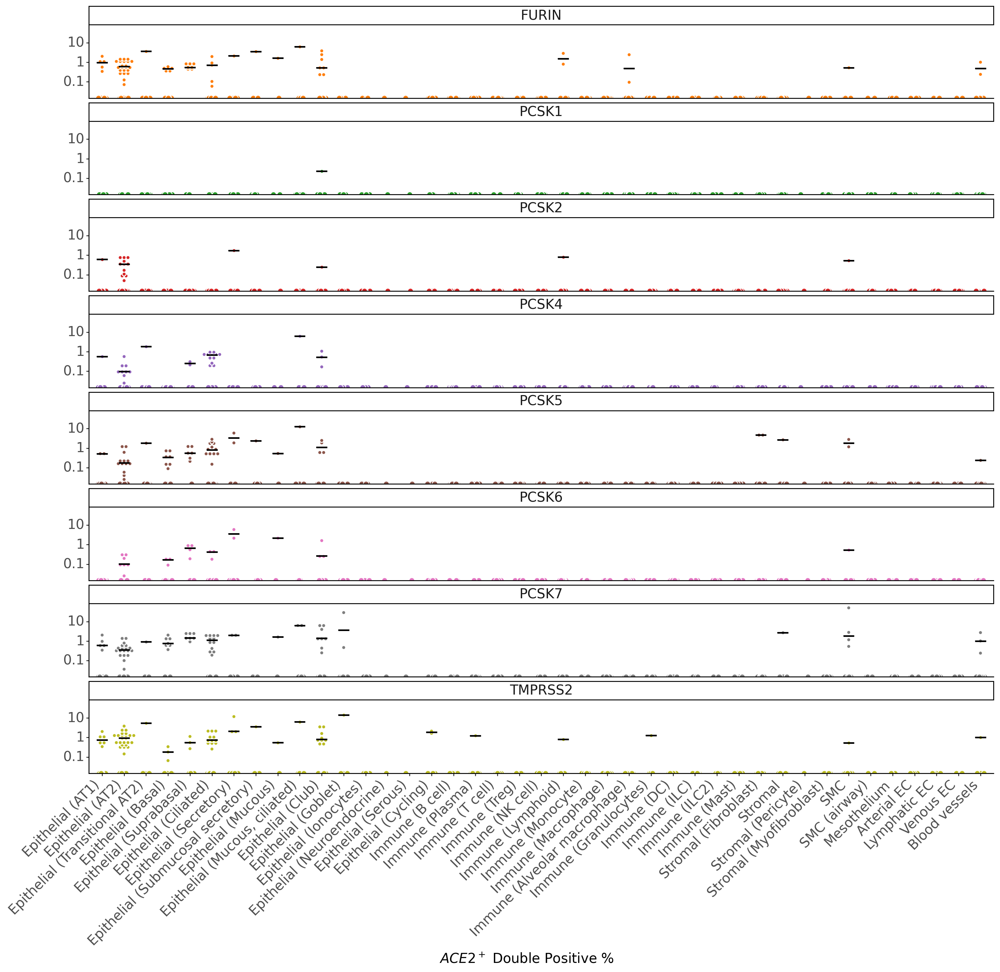

<ggplot: (-9223363307952306116)>

In [428]:
g=(
    ggplot(aes(y='DPPercent', x='Cell Type'), data=df) + 
    geom_jitter(aes(fill='gene'), color='white', height=0, width=0.2, size=3, data=df[df.DPPercent==0]) + 
    geom_dotplot(mapping=aes(fill='gene'), binaxis='y', color='white', position='dodge', bins=30, dotsize=1.8, alpha=1., stackdir='center', data=df[df.DPPercent!=0]) + 
    stat_summary(fun_y = np.median, fun_ymin = np.median, fun_ymax = np.median,  geom = "crossbar", width = 0.5, data=df[df.DPPercent!=0]) +
    theme_classic() + 
    scale_y_continuous(trans='log10') +
    facet_wrap('gene', ncol=1) +
    scale_fill_manual(tab10, guide=False) +
    scale_color_manual(tab10, guide=False) +
    theme(figure_size=(18,15), text = element_text(size=15), axis_text_x=element_text(rotation=45, hjust=1.)) + 
    labs(x=f'$ACE2^+$ Double Positive %', y='', fill='')
) 

ggsave(g, 'figures/figure-5-supplement-protease-DP-european.pdf', width=18, height=15, useDingbats=False)
g

In [430]:
df['sampleID'] = df['sample'].astype(str) + '-' + df['patient'].astype(str) + '-' + df['sex'].astype(str)

## SCDB

In [84]:
scdb = pd.read_csv('scdb_master_df.csv', index_col=0)
scdb = scdb[~scdb.tissue.isna()]
scdb.head()

,study,sample,barcode,tissue,n_counts,ACE2,TMPRSS2,CTSL,FURIN,PCSK1,PCSK2,PCSK4,PCSK5,PCSK6,PCSK7,manual_cell_type
0,GSE104600,GSE104600_matrix,AAACCTGAGGATTCGG-1,blood,881.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1,GSE104600,GSE104600_matrix,AAACGGGCACTTCGAA-1,blood,1429.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2,GSE104600,GSE104600_matrix,AAAGCAAAGAAGCCCA-1,blood,5287.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
3,GSE104600,GSE104600_matrix,AAAGTAGGTAAGTTCC-1,blood,1292.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4,GSE104600,GSE104600_matrix,AAAGTAGTCGGCTTGG-1,blood,1241.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


In [85]:
adata = sc.AnnData(sp.sparse.csr_matrix(scdb[['ACE2']+genes_volcano]),
                   obs=scdb.loc[:, ~scdb.columns.isin(genes_volcano+['ACE2'])], 
                   var=pd.DataFrame(index=['ACE2']+genes_volcano))
adata.obs.tissue = adata.obs.tissue.astype('category')
adata.obs['study_sample'] = adata.obs.study.astype(str) + '-' + adata.obs['sample'].astype(str)
adata.obs['study_sample'] = adata.obs['study_sample'].astype('category')
adata._sanitize()
adata

Transforming to str index.
... storing 'study' as categorical
... storing 'sample' as categorical
... storing 'barcode' as categorical
... storing 'manual_cell_type' as categorical


AnnData object with n_obs × n_vars = 2323564 × 9 
    obs: 'study', 'sample', 'barcode', 'tissue', 'n_counts', 'CTSL', 'manual_cell_type', 'study_sample'

## Fit models

In [23]:
results = fit_coexpression_model(adata, 'scdb', 'ACE2', genes_volcano, 'tissue', 'study_sample')

*** Dataset:                                                         scdb Group:                                  adipose # genes:     2 # cells:    126 ***
*** Dataset:                                                         scdb Group:                                  bladder # genes:     5 # cells:    148 ***
*** Dataset:                                                         scdb Group:                                    blood # genes:     2 # cells:     94 ***
*** Dataset:                                                         scdb Group:                              bone_marrow # genes:     2 # cells:     94 ***
*** Dataset:                                                         scdb Group:                                    brain # genes:     4 # cells:    208 ***
*** Dataset:                                                         scdb Group:                                    ileum # genes:     6 # cells:   5510 ***
*** Dataset:                                              

In [24]:
adata.obs.tissue.cat.categories

Index(['adipose', 'bladder', 'blood', 'bone', 'bone_marrow', 'brain', 'ileum',
       'kidney', 'liver', 'lung', 'lymph_node', 'mammary', 'nasal', 'ovary',
       'peritoneal', 'prostate', 'skin', 'spleen', 'testis', 'tonsil',
       'tumor'],
      dtype='object')

In [25]:
results.celltype = pd.Categorical(results.celltype, categories=adata.obs.tissue.cat.categories)

In [26]:
results.head()

,fixed_effect,Estimate,Std. Error,z value,Pr(>|z|),gene,significant,pval_adj,neglog_pval_adj,celltype,dataset
0,binACE2,38.466232,0.002684,14331.745129,0.000000e+00,PCSK1,True,0.000000e+00,300.000000,lung,scdb
1,binACE2,1.696655,0.001130,1501.063900,0.000000e+00,PCSK6,True,0.000000e+00,300.000000,lung,scdb
2,binACE2,1.895380,0.086929,21.803882,2.131508e-105,TMPRSS2,True,4.263015e-105,104.370283,lung,scdb
3,binACE2,1.331173,0.068977,19.298845,5.492309e-83,PCSK7,True,8.787694e-83,82.056125,lung,scdb
4,binACE2,2.800750,0.162260,17.260902,9.265252e-67,TMPRSS2,True,3.706101e-66,65.431083,ileum,scdb


In [32]:
results.to_csv('tables/figure-5-supplementary-table-scdb-binomial_glmm-celltypes.csv', index=False)

## Dotplot

In [27]:
genes

['FURIN',
 'PCSK1',
 'PCSK2',
 'PCSK4',
 'PCSK5',
 'PCSK6',
 'PCSK7',
 'TMPRSS2',
 'CTSL']

In [28]:
df = results.copy()

df['celltype'] = pd.Categorical(df.celltype, categories=reversed(sorted(df.celltype.cat.categories)))
df['gene'] = pd.Categorical(df.gene, categories=(genes_volcano))

/home/gokcen/.local/lib/python3.8/site-packages/plotnine/ggplot.py:727: PlotnineWarning: Saving 4 x 7 in image.
  warn("Saving {0} x {1} {2} image.".format(
/home/gokcen/.local/lib/python3.8/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5-supplement-coexpression-dotplot-SCDB.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)


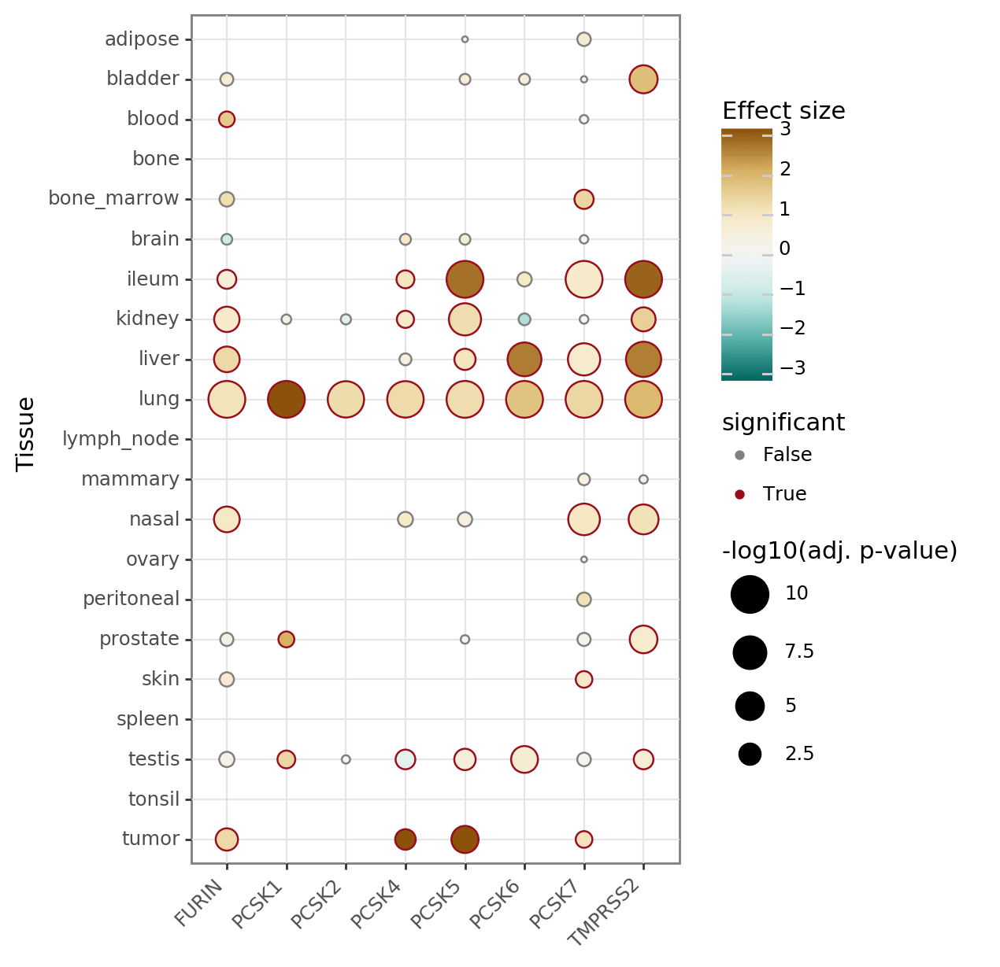

<ggplot: (8777808969774)>


In [29]:
df.loc[df.Estimate < -3, 'Estimate'] = -3
df.loc[df.Estimate > 3, 'Estimate'] = 3
df.loc[df.neglog_pval_adj > 10, 'neglog_pval_adj'] = 10

#df['celltype'] = pd.Categorical(df.celltype, categories = reversed(sorted(df.celltype.unique())))
#df['dataset'] = pd.Categorical(df.dataset, categories = reversed(sorted(df.dataset.unique())))
limit = max(df.Estimate.abs()) * np.array([-1, 1])


g = (
    ggplot(aes(x='gene', y='celltype'), data=df) +
    geom_point(aes(size='neglog_pval_adj', fill='Estimate', color='significant'))+
    scale_fill_distiller(type='div', limits=limit, name='Effect size') + 
    scale_color_manual(values=('#808080', '#990E1D')) + 
    labs(size = "-log10(adj. p-value)", y='Tissue', x='') +
    guides(size = guide_legend(reverse=True)) +
    theme_bw() +
    scale_size(range = (1,9))+
    scale_y_discrete(drop=False) + 
    scale_x_discrete(drop=False) + 
    theme(
      figure_size=(4,7),
      legend_key=element_blank(),
      axis_text_x = element_text(rotation=45, hjust=1.),
    )
)

ggsave(g, 'figures/figure-5-supplement-coexpression-dotplot-SCDB.pdf', width=4, height=7)
print(g)

/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 4 x 7 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5-supplement-coexpression-dotplot-SCDB.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)


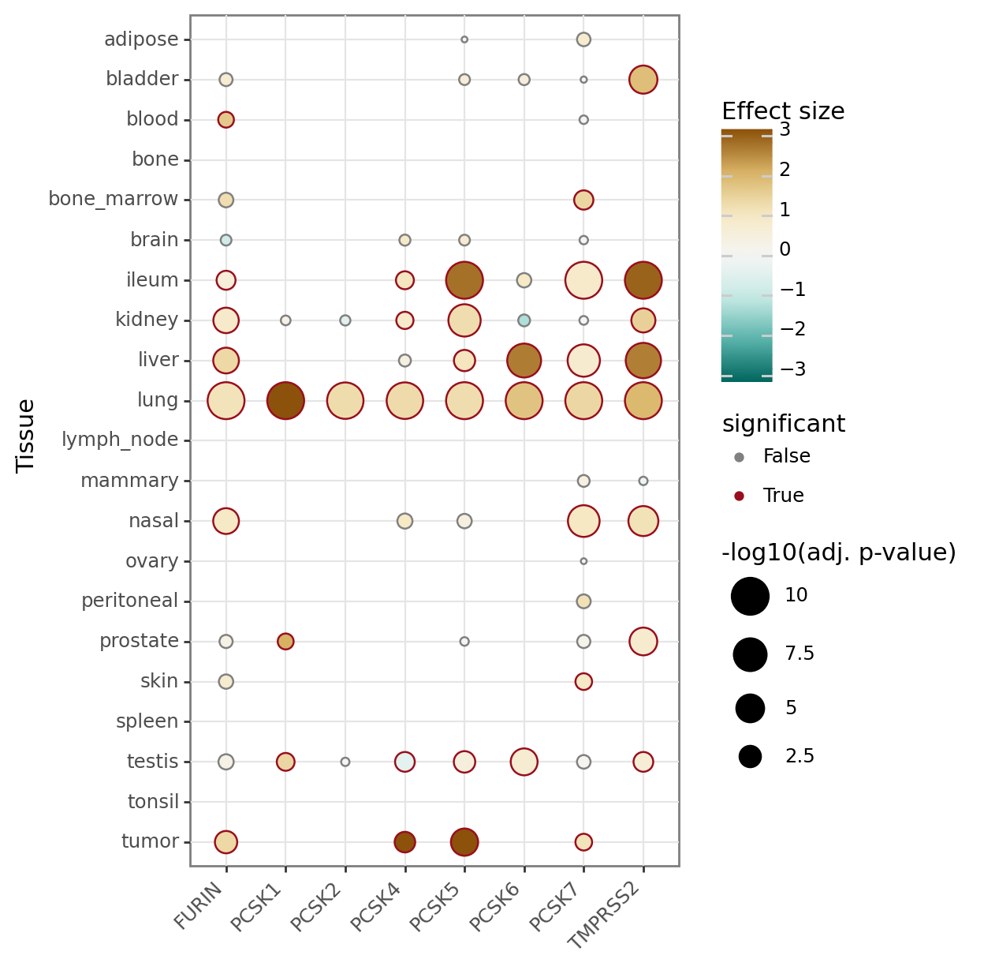

<ggplot: (8731708282646)>


In [92]:
df.loc[df.Estimate < -3, 'Estimate'] = -3
df.loc[df.Estimate > 3, 'Estimate'] = 3
df.loc[df.neglog_pval_adj > 10, 'neglog_pval_adj'] = 10

#df['celltype'] = pd.Categorical(df.celltype, categories = reversed(sorted(df.celltype.unique())))
#df['dataset'] = pd.Categorical(df.dataset, categories = reversed(sorted(df.dataset.unique())))
limit = max(df.Estimate.abs()) * np.array([-1, 1])


g = (
    ggplot(aes(x='gene', y='celltype'), data=df) +
    geom_point(aes(size='neglog_pval_adj', fill='Estimate', color='significant'))+
    scale_fill_distiller(type='div', limits=limit, name='Effect size') + 
    scale_color_manual(values=('#808080', '#990E1D')) + 
    labs(size = "-log10(adj. p-value)", y='Tissue', x='') +
    guides(size = guide_legend(reverse=True)) +
    theme_bw() +
    scale_size(range = (1,9))+
    scale_y_discrete(drop=False) + 
    scale_x_discrete(drop=False) + 
    theme(
      figure_size=(4,7),
      legend_key=element_blank(),
      axis_text_x = element_text(rotation=45, hjust=1.),
    )
)

ggsave(g, 'figures/figure-5-supplement-coexpression-dotplot-SCDB.pdf', width=4, height=7)
print(g)

In [ ]:
df = get_expressed(adata, ['ACE2'] + genes_volcano, ['tissue', 'sample', 'study'])
df.head(20)

/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 8 x 20 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5-supplement-protease-percent-expressed-SCDB.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)


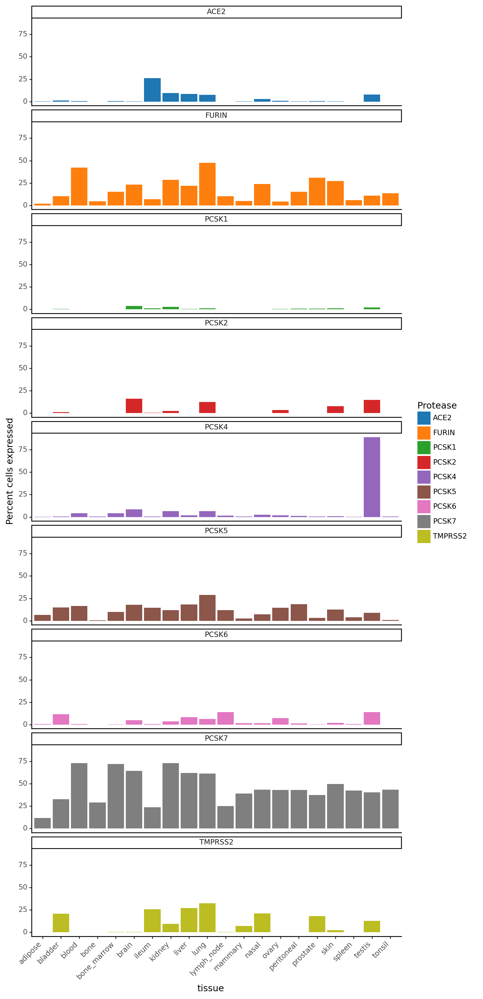

<ggplot: (-9223363309330920174)>

In [489]:
g = (
    ggplot(aes(x='tissue', y='Percent exp.', fill='gene'), data=df) + 
    geom_bar(stat='identity', position='dodge') +
    facet_wrap('gene', ncol=1) +
    theme_classic() + 
    theme(figure_size=(8,20), axis_text_x=element_text(rotation=45, hjust=1.)) +
    scale_fill_cmap_d('tab10') +
    labs(x='tissue', y='Percent cells expressed', fill='Protease')
)

ggsave(g, 'figures/figure-5-supplement-protease-percent-expressed-SCDB.pdf', width=8, height=20)
g

In [490]:
for secondgene in genes_volcano:
    adata.obs[f'ACE2+{secondgene}+'] = (adata.obs_vector('ACE2')>0) & (adata.obs_vector(secondgene)>0)

In [ ]:
dp_columns = [f'ACE2+{secondgene}+' for secondgene in genes_volcano]

df = adata[adata.obs.tissue!='nan'].obs.groupby(['tissue', 'sample', 'study'], observed=True)[dp_columns].mean().dropna()
df *= 100
df = df.reset_index().rename(columns={k:v for k,v in zip(dp_columns, genes_volcano)})
df.head(20)

In [493]:
df_median = df[genes_volcano + ['tissue']].copy().set_index('tissue')
df_median[df_median==0] = np.nan
df_median.reset_index().groupby('tissue').agg(np.nanmedian)

,FURIN,PCSK1,PCSK2,PCSK4,PCSK5,PCSK6,PCSK7,TMPRSS2
tissue,,,,,,,,
adipose,0.010323,NaN,NaN,NaN,0.011826,0.023652,0.053272,NaN
bladder,0.119170,NaN,NaN,0.056180,0.448828,0.117573,0.296540,0.495937
blood,0.025036,NaN,NaN,NaN,NaN,NaN,0.041120,NaN
bone,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
bone_marrow,0.023685,NaN,NaN,NaN,NaN,NaN,0.028121,NaN
brain,0.017735,0.006122,0.008868,0.031881,0.026603,0.012191,0.049847,0.005064
ileum,0.036403,0.022333,NaN,0.071023,0.138118,0.020239,0.168275,0.185128
kidney,0.044547,0.009232,0.046713,0.034131,0.061548,0.001987,0.049963,0.037488
liver,0.074212,NaN,NaN,0.197093,0.048876,0.049627,0.055525,0.054845


In [494]:
#df = df[df['Cell Type'].isin(celltype_nonzero)]

In [496]:
df = df.melt(value_vars=genes_volcano, id_vars=['tissue', 'sample', 'study'], var_name='gene', value_name='DPPercent')

In [497]:
pal = cm.get_cmap(plt.get_cmap('tab10'))
tab10 = [to_hex(x) for x in pal.colors][1:]

/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 15 x 15 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5-supplement-protease-DP-scdb.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/pandas/core/series.py:853: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/gokcen/.local/lib/python3.7/site-packages/pandas/core/series.py:853: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


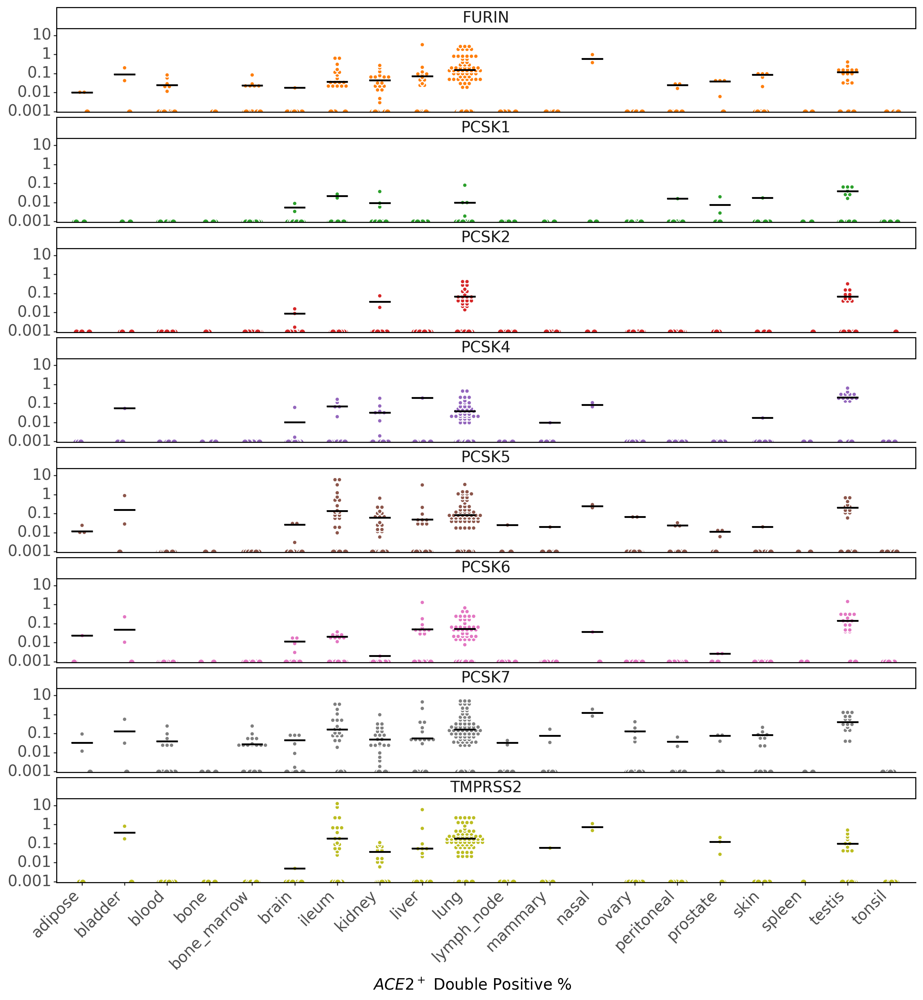

<ggplot: (-9223363308047623634)>

In [499]:
g=(
    ggplot(aes(y='DPPercent', x='tissue'), data=df) + 
    geom_jitter(aes(fill='gene'), color='white', height=0, width=0.2, size=3, data=df[df.DPPercent==0]) + 
    geom_dotplot(mapping=aes(fill='gene'), binaxis='y', color='white', position='dodge', bins=30, dotsize=1.8, alpha=1., stackdir='center', data=df[df.DPPercent!=0]) + 
    stat_summary(fun_y = np.median, fun_ymin = np.median, fun_ymax = np.median,  geom = "crossbar", width = 0.5, data=df[df.DPPercent!=0]) +
    theme_classic() + 
    scale_y_continuous(trans='log10') +
    facet_wrap('gene', ncol=1) +
    scale_fill_manual(tab10, guide=False) +
    scale_color_manual(tab10, guide=False) +
    theme(figure_size=(15,15), text = element_text(size=15), axis_text_x=element_text(rotation=45, hjust=1.)) + 
    labs(x=f'$ACE2^+$ Double Positive %', y='', fill='')
) 

ggsave(g, 'figures/figure-5-supplement-protease-DP-scdb.pdf', width=15, height=15, useDingbats=False)
g

## DP Signature Overlap

In [108]:
sheetnames = ['AT1', 'AT2', 'Basal', 'Ciliated', 'Secretory']

In [109]:
signatures = pd.concat([pd.read_excel('2020-04-04.COVID_genemodule_lung.xlsx', sheet_name=x)[['gene', 'padjH', 'log2fc', 'celltype', 'alpha', 'mastfc']] for x in sheetnames]).reset_index(drop=True).dropna()
signatures.columns = ['gene', 'pval_adj', 'log2fc', 'celltype', 'alpha', 'mastfc']
signatures.head()

,gene,pval_adj,log2fc,celltype,alpha,mastfc
0,DYNLL1,0.053444,-0.348965,AT1,1.000000,1.635531
1,ATP5D,0.073741,0.331427,AT1,0.862069,1.635531
2,FTH1,0.091676,0.392117,AT1,1.000000,1.635531
3,ACY3,0.175854,1.268172,AT1,0.068966,1.635531
4,STN1,0.196452,-1.094032,AT1,0.068966,1.635531


In [110]:
genes_volcano

['FURIN', 'PCSK1', 'PCSK2', 'PCSK4', 'PCSK5', 'PCSK6', 'PCSK7', 'TMPRSS2']

In [111]:
celltype_order = [
    'Epithelial (AT1)',
    'Epithelial (AT2)',
    'Epithelial (Basal)',
    'Epithelial (Secretory)',
    'Epithelial (Ciliated)',
]

In [112]:
df = signatures.copy()

df = df[~df.gene.isin(['ACE2', 'TMPRSS2'])]
df = df[df.gene.isin(proteases)]

df['celltype'] = pd.Categorical([f'Epithelial ({x})' for x in df.celltype], categories=celltype_order)
df['neglog_pval_adj'] = -np.log10(df.pval_adj+1e-300)
#df['significant'] = (df.pval_adj < 0.05) & (np.abs(df.log2fc)>0.5) & (df.alpha>0.1)
df['significant'] = (df.pval_adj < 0.05) & (np.abs(df.log2fc)>0.5)
df['furin'] = df.gene.isin(genes_volcano)

df.head()

,gene,pval_adj,log2fc,celltype,alpha,mastfc,neglog_pval_adj,significant,furin
3,ACY3,0.175854,1.268172,Epithelial (AT1),0.068966,1.635531,0.754849,False,False
41,USP37,1.000000,-13.208798,Epithelial (AT1),0.000000,1.635531,-0.000000,False,False
53,PSMB9,0.026147,0.853604,Epithelial (AT1),0.827586,0.797606,1.582574,True,False
54,PSMB8,0.025020,0.556077,Epithelial (AT1),0.896552,0.775754,1.601709,True,False
74,CTSC,0.017306,1.033812,Epithelial (AT1),0.655172,0.602503,1.761811,True,False


In [113]:
top20_at2 = df[(df.celltype == 'Epithelial (AT2)') & (df.significant) & (df.mastfc>0)].sort_values(['pval_adj']) #.gene[:20].values
top20_at2

,gene,pval_adj,log2fc,celltype,alpha,mastfc,neglog_pval_adj,significant,furin
34652,MALT1,0.000056,0.578491,Epithelial (AT2),0.154455,0.031428,4.254401,True,False
34268,CFI,0.000633,0.523412,Epithelial (AT2),0.548515,0.075976,3.198582,True,False
34193,CTSS,0.000692,0.537478,Epithelial (AT2),0.627723,0.123435,3.160136,True,False
34963,BACE1,0.000970,0.831592,Epithelial (AT2),0.104950,0.020684,3.013116,True,False
34293,ZC3H12A,0.001020,0.530893,Epithelial (AT2),0.423762,0.069627,2.991404,True,False
35158,GGT6,0.003258,0.508364,Epithelial (AT2),0.075248,0.015406,2.487055,True,False
35292,TMPRSS13,0.005473,0.546741,Epithelial (AT2),0.116832,0.012991,2.261750,True,False
35936,OSGEPL1,0.006094,-0.511741,Epithelial (AT2),0.065347,0.000603,2.215130,True,False
35326,PCSK6,0.006358,0.546632,Epithelial (AT2),0.100990,0.012455,2.196705,True,True
34869,TRAP1,0.006401,-0.519507,Epithelial (AT2),0.396040,0.022734,2.193784,True,False


In [114]:
df['topat2'] = False
df.loc[(df.celltype == 'Epithelial (AT2)') & (df.gene.isin(top20_at2)), 'topat2'] = True

/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 7 x 7 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5g-signature-protease-overlap-volcano.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/layer.py:464: PlotnineWarning: geom_point : Removed 1 rows containing missing values.
  self.data = self.geom.handle_na(self.data)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/layer.py:464: PlotnineWarning: geom_point : Removed 1 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


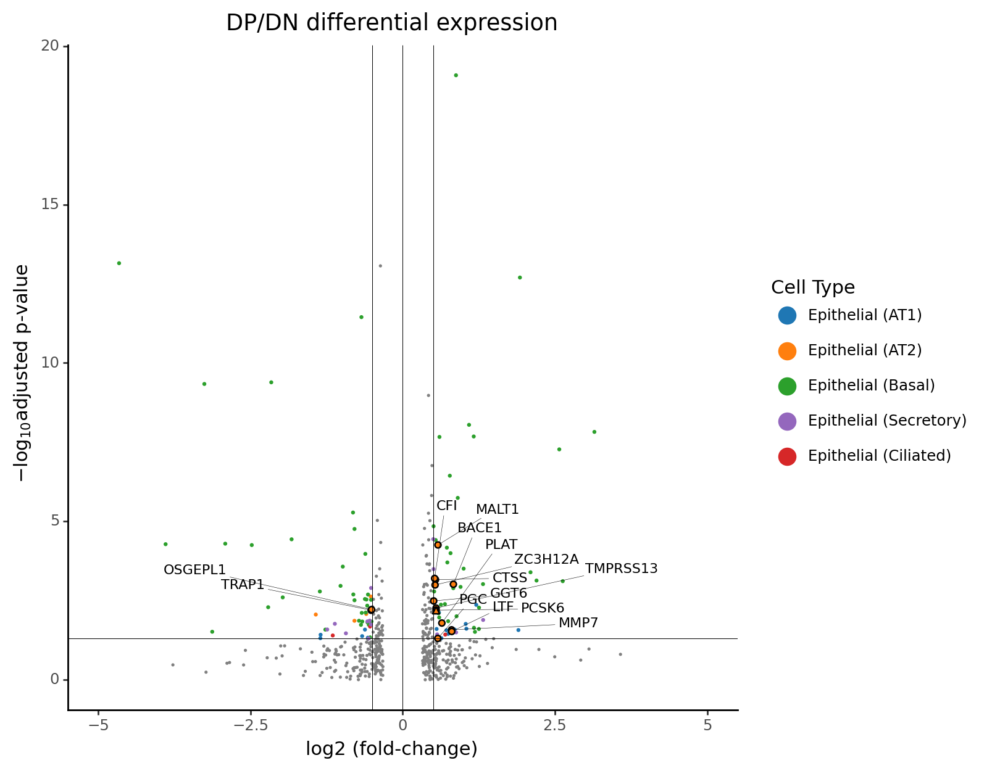

<ggplot: (-9223363305142269738)>

In [133]:
#df.loc[df.neglog_pval_adj>5, 'neglog_pval_adj'] = np.inf
#df.loc[df.mastfc > 0.5, 'mastfc'] = np.inf
#df.loc[df.log2fc < -5, 'fc'] = -np.inf

df_text_idx = ((df.furin) & (df.significant)) | df.topat2  #& (df.neglog_pval_adj>2) #& (df.logodds>0.3)
#df_text_idx = df.topat2

g = (
    ggplot(aes(x='log2fc', y='neglog_pval_adj'), data=df[df.significant]) + 
    geom_point(size=0.05, data=df[~df.significant], color='gray') +                                                     # non-significant
    geom_point(aes(color='celltype'), size=0.3, data=df[(~df.furin) & (df.significant)]) +                              # significant non-furin
    geom_point(aes(fill='celltype'), color='black', size=1.5, data=df[df.topat2]) +                                     # significant top20 AT2
    geom_point(aes(fill='celltype'), color='black', size=1.8, shape='^', data=df[(df.furin) & (df.significant)]) +      # significant furin
    geom_hline(yintercept=-np.log10(0.05), size=0.2) +
    geom_vline(xintercept=0.5, size=0.2) +
    geom_vline(xintercept=-0.5, size=0.2) +   
    geom_vline(xintercept=0, size=0.2) +
    geom_text(aes(label='gene'), 
              size=8,
              color='black', 
              fontweight='normal',
              data=df[df_text_idx],
              adjust_text={'arrowprops': {'arrowstyle': '-', 'lw':0.2}, 'x':df.log2fc.values, 'y':df.neglog_pval_adj.values, 'expand_points': (2.,2.0)}
             ) + 
    theme_classic() + 
    theme(figure_size=(7,7)) +
    labs(x='log2 (fold-change)', y='$-\log_{10}$adjusted p-value', color='Cell Type', title='DP/DN differential expression') +
    scale_color_manual(values=type2color) +
    scale_fill_manual(values=type2color) + lims(x=[-5,5]) +
    guides(color = guide_legend(override_aes = dict(size=5)), fill=None)
)

ggsave(g, 'figures/figure-5g-signature-protease-overlap-volcano.pdf', width=7, height=7, useDingbats=False)

g

/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 7 x 7 in image.
  from_inches(height, units), units), PlotnineWarning)
/home/gokcen/.local/lib/python3.7/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure-5g-signature-protease-overlap-volcano.pdf
  warn('Filename: {}'.format(filename), PlotnineWarning)


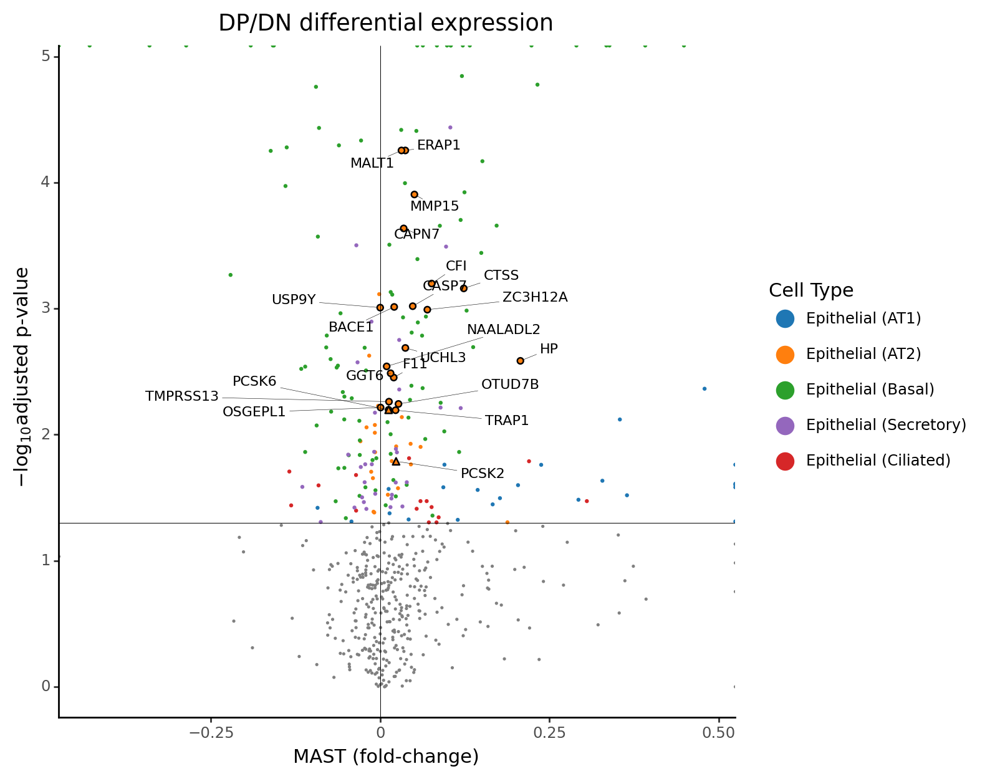

<ggplot: (8731722686107)>

In [106]:
df.loc[df.neglog_pval_adj>5, 'neglog_pval_adj'] = np.inf
df.loc[df.mastfc > 0.5, 'mastfc'] = np.inf
df.loc[df.mastfc < -0.5, 'mastfc'] = -np.inf

df_text_idx = ((df.furin) & (df.significant)) | df.topat2  #& (df.neglog_pval_adj>2) #& (df.logodds>0.3)
#df_text_idx = df.topat2

g = (
    ggplot(aes(x='mastfc', y='neglog_pval_adj'), data=df[df.significant]) + 
    geom_point(size=0.05, data=df[~df.significant], color='gray') +                                                     # non-significant
    geom_point(aes(color='celltype'), size=0.3, data=df[(~df.furin) & (df.significant)]) +                              # significant non-furin
    geom_point(aes(fill='celltype'), color='black', size=1.5, data=df[df.topat2]) +                                     # significant top20 AT2
    geom_point(aes(fill='celltype'), color='black', size=1.8, shape='^', data=df[(df.furin) & (df.significant)]) +      # significant furin
    geom_hline(yintercept=-np.log10(0.05), size=0.2) +
    #geom_vline(xintercept=0.5, size=0.2) +
    geom_vline(xintercept=0, size=0.2) +
    geom_text(aes(label='gene'), 
              size=8,
              color='black', 
              fontweight='normal',
              data=df[df_text_idx],
              adjust_text={'arrowprops': {'arrowstyle': '-', 'lw':0.2}, 'x':df.mastfc.values, 'y':df.neglog_pval_adj.values, 'expand_points': (2.,2.0)}
             ) + 
    theme_classic() + 
    theme(figure_size=(7,7)) +
    labs(x='MAST (fold-change)', y='$-\log_{10}$adjusted p-value', color='Cell Type', title='DP/DN differential expression') +
    scale_color_manual(values=type2color) +
    scale_fill_manual(values=type2color) + #lims(x=[-0.75,0.75], y=[0, 7.5]) +
    guides(color = guide_legend(override_aes = dict(size=5)), fill=None)
)

#ggsave(g, 'figures/figure-5g-signature-protease-overlap-volcano.pdf', width=7, height=7, useDingbats=False)

g